# [1] Necessary imports

In [2]:
%load_ext autoreload
%autoreload 2
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

In [3]:
# NAME: loader.py
# DESCRIPTION: data loader for raw kitti data

import os
import sys
# sys.path.append('/home/ruizhu/Documents/Projects/kitti_instance_RGBD_utils/deepSfm_ori/FME')

import numpy as np 
import scipy.misc
import os
import cv2
from glob import glob

from path import Path
from tqdm import tqdm
import logging
logger = logging.getLogger()
logger.setLevel(logging.INFO)

from torch.utils.data import Dataset

# for test
# from config import get_config
# config, unparsed = get_config()

from IPython.core.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))
import argparse
from pebble import ProcessPool

## Test dump_img_odo

In [4]:
# NAME: loader.py
# DESCRIPTION: data loader for raw kitti data

import os
import sys
# sys.path.append('/home/ruizhu/Documents/Projects/kitti_instance_RGBD_utils/deepSfm_ori/FME')

import numpy as np 
import scipy.misc
import os
import cv2
from glob import glob
import time

from path import Path
from tqdm import tqdm
import logging
logger = logging.getLogger()
logger.setLevel(logging.INFO)

from torch.utils.data import Dataset

# for test
# from config import get_config
# config, unparsed = get_config()

import argparse
from pebble import ProcessPool
import multiprocessing as mp
# ratio_CPU = 0.5
# default_number_of_process = int(ratio_CPU * mp.cpu_count())
default_number_of_process = 1 # to prevent congestion; SIFT and matrix operations in recfity points already takes advantage of multi-cores
import time

import sys; sys.argv=['']; del sys # solve the error for jupyter notebook

parser = argparse.ArgumentParser(description='Foo')
parser.add_argument("--dataset_dir", type=str, default="/data/KITTI/raw_meta/", help="path to dataset")   
parser.add_argument("--num_threads", type=int, default=default_number_of_process, help="number of thread to load data")
parser.add_argument("--cam_id", type=str, default='02', help="number of thread to load data")
parser.add_argument("--img_height", type=int, default=376, help="number of thread to load data")
parser.add_argument("--img_width", type=int, default=1241, help="number of thread to load data")
parser.add_argument("--static_frames_file", type=str, default=None, help="static data file path")
parser.add_argument("--test_scene_file", type=str, default=None, help="test data file path")
parser.add_argument('--dump', action='store_true', default=False)
parser.add_argument("--with_X", action='store_true', default=False,
                    help="If available (e.g. with KITTI), will store visable rectified lidar points ground truth along with images, for validation")
parser.add_argument("--with_pose", action='store_true', default=True,
                    help="If available (e.g. with KITTI), will store pose ground truth along with images, for validation")
parser.add_argument("--with_sift", action='store_true', default=False,
                    help="If available (e.g. with KITTI), will store SIFT points ground truth along with images, for validation")
parser.add_argument("--with_SP", action='store_true', default=False,
                    help="If available (e.g. with KITTI), will store SuperPoint points ground truth along with images, for validation")
parser.add_argument("--dump_root", type=str, default='dump', help="Where to dump the data")

# args = parser.parse_args('--dump --with_X --with_pose --with_sift \
#     --static_frames_file /home/ruizhu/Documents/Projects/SfmLearner-Pytorch/data/static_frames.txt \
#     --test_scene_file /home/ruizhu/Documents/Projects/SfmLearner-Pytorch/data/test_scenes.txt \
#     --dataset_dir /home/ruizhu/Documents/Datasets/kitti/raw \
#     --dump_root /home/ruizhu/Documents/Datasets/kitti/corr_dump'.split())



_StoreAction(option_strings=['--dump_root'], dest='dump_root', nargs=None, const=None, default='dump', type=<class 'str'>, choices=None, help='Where to dump the data', metavar=None)

## Test kitti loader

In [8]:
args = parser.parse_args("--dump --dataset_dir /data/kitti/odometry --with_pose --with_X \
                        --with_sift --dump_root /home/ruizhu/Documents/Datasets/kitti/kitti_dump/odo_corr_dump_siftIdx_npy_delta1235810_full \
                        --num_threads=1".split())
print(args)

%reload_ext autoreload
%autoreload 2

from kitti_odo_loader import KittiOdoLoader
assert args.cam_id in ['00', '02'], 'Only supported left greyscale/color cameras (cam 00 or 02)!'
data_loader = KittiOdoLoader(args.dataset_dir,
                             img_height=args.img_height,
                             img_width=args.img_width,
                             cam_ids=[args.cam_id],
                             get_X=args.with_X,
                             get_pose=args.with_pose,
                             get_sift=args.with_sift, 
                             get_SP=args.with_SP)

print(f"data_loader: {data_loader}")
n_scenes = {'train': len(data_loader.scenes['train']), 'test': len(data_loader.scenes['test'])}
print('Found %d potential train scenes, and %d test scenes.'%(n_scenes['train'], n_scenes['test']))

print(f"one scene: {data_loader.scenes['train'][0]}")

# for j, sample in enumerate(data_loader):
#     if j>0: break
#     print(f"sample: {sample}")

2019-10-10 09:44:51 ubuntu root[10766] INFO +++ Dumping as npy


Namespace(cam_id='02', dataset_dir='/data/kitti/odometry', dump=True, dump_root='/home/ruizhu/Documents/Datasets/kitti/kitti_dump/odo_corr_dump_siftIdx_npy_delta1235810_full', img_height=376, img_width=1241, num_threads=1, static_frames_file=None, test_scene_file=None, with_SP=False, with_X=True, with_pose=True, with_sift=True)
data_loader: <kitti_odo_loader.KittiOdoLoader object at 0x7fe93cc6c7b8>
Found 9 potential train scenes, and 2 test scenes.
one scene: /data/kitti/odometry/sequences/00


In [9]:
# dump scenes
drive_path = data_loader.scenes['train'][4]
split = 'train'
data_loader.dump_drive(args, drive_path, split=split, scene_data=None)

2019-10-10 09:44:54 ubuntu root[10766] INFO Gathering info for /data/kitti/odometry/sequences/04...

  0%|          | 0/271 [00:00<?, ?it/s]2019-10-10 09:44:54 ubuntu root[10766] WARNING [/data/kitti/odometry/sequences/04/image_2/000000.png] Zooming the image (H370, W1226) with zoom_yH=1.016216, zoom_xW=1.012235 to (H376, W1241).

 61%|██████    | 165/271 [00:37<00:25,  4.11it/s]


100%|██████████| 271/271 [00:56<00:00,  4.83it/s]2019-10-10 09:45:50 ubuntu root[10766] WARNING dump_root exists: /home/ruizhu/Documents/Datasets/kitti/kitti_dump/odo_corr_dump_siftIdx_npy_delta1235810_full/04_02
2019-10-10 09:45:50 ubuntu root[10766] INFO Dumping 271 samples to /home/ruizhu/Documents/Datasets/kitti/kitti_dump/odo_corr_dump_siftIdx_npy_delta1235810_full/04_02...

  0%|          | 0/271 [00:00<?, ?it/s]

---scale_P
---scale_P
---scale_P
---scale_P
dump_dir: /home/ruizhu/Documents/Datasets/kitti/kitti_dump/odo_corr_dump_siftIdx_npy_delta1235810_full/04_02
velo: (124231, 3)
velo_homo: (124231, 4)
X_rect: (61970, 3)
X_cam0: (61970, 3)
val_idxes: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 684, 685, 686, 687, 688, 689, 690, 691, 692, 693, 694, 695, 696, 697, 698, 699, 700, 701, 702, 703, 704, 705, 706, 707, 708, 709, 710, 7


  0%|          | 1/271 [00:01<04:38,  1.03s/it]

sample_name_list: 04_02 000000
velo: (124087, 3)
velo_homo: (124087, 4)


X_rect: (61890, 3)
X_cam0: (61890, 3)
val_idxes: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 682, 683, 684, 685, 686, 687, 688, 689, 690, 691, 692, 693, 694, 695, 696, 697, 698, 699, 700, 701, 702, 703, 704, 705, 706, 707, 708, 709, 710, 711, 712, 713, 714, 715, 716, 717, 718, 719, 720, 721, 722, 723, 724, 725, 726, 727, 728, 729, 730, 731, 732, 733, 734, 735, 736, 737, 738, 739, 740, 741, 742, 743, 744, 745, 746, 747, 748, 749, 750, 


  1%|          | 2/271 [00:02<05:18,  1.19s/it]

sample_name_list: 04_02 000001
velo: (123861, 3)
velo_homo: (123861, 4)


X_rect: (61783, 3)
X_cam0: (61783, 3)
val_idxes: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 680, 681, 682, 683, 684, 685, 686, 687, 688, 689, 690, 691, 692, 693, 694, 695, 696, 697, 698, 699, 700, 701, 702, 703, 704, 705, 706, 707, 708, 709, 710, 711, 712, 713, 714, 715, 716, 717, 718, 719, 720, 721, 722, 723, 724, 725, 726, 727, 728, 729, 730, 731, 732, 733, 734, 735, 736, 737, 738, 739, 740, 741, 742, 743, 744, 745, 746, 747, 748, 749, 750, 751, 752, 753, 754, 755, 


  1%|          | 3/271 [00:03<05:25,  1.21s/it]

sample_name_list: 04_02 000002
velo: (123679, 3)
velo_homo: (123679, 4)


X_rect: (61703, 3)
X_cam0: (61703, 3)
val_idxes: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 679, 680, 681, 682, 683, 684, 685, 686, 687, 688, 689, 690, 691, 692, 693, 694, 695, 696, 697, 698, 699, 700, 701, 702, 703, 704, 705, 706, 707, 708, 709, 710, 711, 712, 713, 714, 715, 716, 717, 718, 719, 720, 721, 722, 723, 724, 725, 726, 727, 728, 729, 730, 731, 732, 733, 734, 735, 736, 737, 738, 739, 740, 741, 742, 743, 744, 745, 746, 


  1%|▏         | 4/271 [00:06<06:43,  1.51s/it]

sample_name_list: 04_02 000003
velo: (123431, 3)
velo_homo: (123431, 4)


X_rect: (61653, 3)
X_cam0: (61653, 3)
val_idxes: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 690, 691, 692, 693, 694, 695, 696, 697, 698, 699, 700, 701, 702, 703, 704, 705, 706, 707, 708, 709, 710, 711, 712, 713, 714, 715, 716, 717, 718, 719, 720, 721, 722, 723, 724, 725, 726, 727, 728, 729, 730, 731, 732, 733, 734, 735, 736, 737, 738, 739, 740, 741, 742, 743, 744, 745, 746, 747, 748, 749, 750, 751, 752, 753, 754, 


  2%|▏         | 5/271 [00:07<06:56,  1.56s/it]

sample_name_list: 04_02 000004
velo: (123298, 3)
velo_homo: (123298, 4)


X_rect: (61564, 3)
X_cam0: (61564, 3)
val_idxes: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 699, 700, 701, 702, 703, 704, 705, 706, 707, 708, 709, 710, 711, 712, 713, 714, 715, 716, 717, 718, 719, 720, 721, 722, 723, 724, 725, 726, 727, 728, 729, 730, 731, 732, 733, 734, 735, 736, 737, 738, 739, 740, 741, 742, 743, 744, 745, 746, 747, 748, 749, 750, 751, 752, 753, 


  2%|▏         | 6/271 [00:09<07:16,  1.65s/it]

sample_name_list: 04_02 000005


velo: (123229, 3)
velo_homo: (123229, 4)
X_rect: (61550, 3)
X_cam0: (61550, 3)
val_idxes: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 698, 699, 700, 701, 702, 703, 704, 705, 706, 707, 708, 709, 710, 711, 712, 713, 714, 715, 716, 717, 718, 719, 720, 721, 722, 723, 724, 725, 726, 727, 728, 729, 730, 731, 732, 733, 734, 735, 736, 737, 738, 739, 740, 741, 742, 743, 744, 745, 746, 747, 748, 749,


  3%|▎         | 7/271 [00:12<08:19,  1.89s/it]

sample_name_list: 04_02 000006
velo: (122881, 3)
velo_homo: (122881, 4)


X_rect: (61373, 3)
X_cam0: (61373, 3)
val_idxes: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 698, 699, 700, 701, 702, 703, 704, 705, 706, 707, 708, 709, 710, 711, 712, 713, 714, 715, 716, 717, 718, 719, 720, 721, 722, 723, 724, 725, 726, 727, 728, 729, 730, 731, 732, 733, 734, 735, 736, 737, 738, 739, 740, 741, 742, 743, 744, 745, 746, 747, 748, 749, 750, 751, 752, 753, 754, 755, 756, 


  3%|▎         | 8/271 [00:14<08:24,  1.92s/it]

sample_name_list: 04_02 000007
velo: (122870, 3)
velo_homo: (122870, 4)


X_rect: (61383, 3)
X_cam0: (61383, 3)
val_idxes: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 694, 695, 696, 697, 698, 699, 700, 701, 702, 703, 704, 705, 706, 707, 708, 709, 710, 711, 712, 713, 714, 715, 716, 717, 718, 719, 720, 721, 722, 723, 724, 725, 726, 727, 728, 729, 730, 731, 732, 733, 734, 735, 736, 737, 738, 739, 740, 741, 742, 743, 744, 745, 746, 747, 748, 749, 750, 751, 752, 753, 754, 755, 756,


  3%|▎         | 9/271 [00:16<08:49,  2.02s/it]

sample_name_list: 04_02 000008
velo: (122909, 3)
velo_homo: (122909, 4)


X_rect: (61545, 3)
X_cam0: (61545, 3)
val_idxes: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 696, 697, 698, 699, 700, 701, 702, 703, 704, 705, 706, 707, 708, 709, 710, 711, 712, 713, 714, 715, 716, 717, 718, 719, 720, 721, 722, 723, 724, 725, 726, 727, 728, 729, 730, 731, 732, 733, 734, 735, 736, 737, 738, 739, 740, 741, 742, 743, 744, 745, 746, 747, 748, 749, 750, 751, 752, 753, 


  4%|▎         | 10/271 [00:17<08:20,  1.92s/it]

sample_name_list: 04_02 000009
velo: (122975, 3)
velo_homo: (122975, 4)


X_rect: (61329, 3)
X_cam0: (61329, 3)
val_idxes: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 704, 705, 706, 707, 708, 709, 710, 711, 712, 713, 714, 715, 716, 717, 718, 719, 720, 721, 722, 723, 724, 725, 726, 727, 728, 729, 730, 731, 732, 733, 734, 735, 736, 737, 738, 739, 740, 741, 742, 743, 744, 745, 746, 747, 748, 749, 750, 751, 752, 753, 754, 755, 756, 757, 758, 759, 760, 


  4%|▍         | 11/271 [00:20<08:44,  2.02s/it]

sample_name_list: 04_02 000010


velo: (123132, 3)
velo_homo: (123132, 4)
X_rect: (61532, 3)
X_cam0: (61532, 3)
val_idxes: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 714, 715, 719, 720, 721, 722, 723, 724, 725, 726, 727, 728, 729, 730, 731, 732, 733, 734, 735, 736, 737, 738, 739, 740, 741, 742, 743, 744, 745, 746, 747, 748, 749, 750, 751, 752, 753, 754, 755, 756, 757, 758, 759, 760,


  4%|▍         | 12/271 [00:22<08:57,  2.07s/it]

sample_name_list: 04_02 000011
velo: (123005, 3)
velo_homo: (123005, 4)


X_rect: (61606, 3)
X_cam0: (61606, 3)
val_idxes: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 711, 712, 713, 714, 715, 716, 717, 718, 719, 720, 721, 722, 723, 724, 725, 726, 727, 728, 729, 730, 731, 732, 733, 734, 735, 736, 737, 738, 739, 740, 741, 742, 743, 744, 745, 746, 747, 748, 749, 750, 751, 752, 753, 754, 755, 756, 757, 758, 759, 760, 761, 


  5%|▍         | 13/271 [00:24<08:37,  2.00s/it]

sample_name_list: 04_02 000012
velo: (122993, 3)
velo_homo: (122993, 4)


X_rect: (61630, 3)
X_cam0: (61630, 3)
val_idxes: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 696, 697, 698, 699, 700, 701, 702, 703, 704, 705, 706, 707, 708, 709, 710, 711, 712, 713, 714, 715, 716, 717, 718, 719, 720, 721, 722, 723, 724, 725, 726, 727, 728, 729, 730, 731, 732, 733, 734, 735, 736, 737, 738, 739, 740, 741, 742, 743, 744, 745, 746, 747, 748, 749, 750, 


  5%|▌         | 14/271 [00:26<08:38,  2.02s/it]

sample_name_list: 04_02 000013
velo: (122925, 3)
velo_homo: (122925, 4)


X_rect: (61613, 3)
X_cam0: (61613, 3)
val_idxes: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 705, 706, 707, 708, 709, 710, 711, 712, 713, 714, 715, 716, 717, 718, 719, 720, 721, 722, 723, 724, 725, 726, 727, 728, 729, 730, 731, 732, 733, 734, 735, 736, 737, 738, 739, 740, 741, 742, 743, 744, 745, 746, 747, 748, 749, 750, 751, 752, 753, 754, 755, 


  6%|▌         | 15/271 [00:28<08:38,  2.03s/it]

sample_name_list: 04_02 000014
velo: (122915, 3)
velo_homo: (122915, 4)


X_rect: (61555, 3)
X_cam0: (61555, 3)
val_idxes: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 684, 685, 686, 687, 688, 689, 690, 691, 692, 693, 694, 695, 696, 697, 698, 699, 700, 701, 702, 703, 704, 705, 706, 707, 708, 709, 710, 711, 712, 713, 714, 715, 716, 717, 718, 719, 720, 721, 722, 723, 724, 725, 726, 727, 728, 729, 730, 731, 732, 733, 734, 735, 736, 737, 738, 


  6%|▌         | 16/271 [00:29<07:54,  1.86s/it]

sample_name_list: 04_02 000015
velo: (122944, 3)
velo_homo: (122944, 4)


X_rect: (61373, 3)
X_cam0: (61373, 3)
val_idxes: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 681, 682, 683, 684, 685, 686, 687, 688, 689, 690, 691, 692, 693, 694, 695, 696, 697, 698, 699, 700, 701, 702, 703, 704, 705, 706, 707, 708, 709, 710, 711, 712, 713, 714, 715, 716, 717, 718, 719, 720, 721, 722, 723, 724, 725, 726, 727, 728, 729, 730, 731, 732, 733, 734, 735, 


  6%|▋         | 17/271 [00:31<08:11,  1.93s/it]

sample_name_list: 04_02 000016


velo: (122903, 3)
velo_homo: (122903, 4)
X_rect: (61474, 3)
X_cam0: (61474, 3)
val_idxes: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 678, 679, 680, 681, 682, 683, 684, 685, 686, 687, 688, 689, 690, 691, 692, 693, 694, 695, 696, 697, 698, 699, 700, 701, 702, 703, 704, 705, 706, 707, 708, 709, 710, 711, 712, 713, 714, 715, 716, 717, 718, 719, 720, 721, 722, 723, 724, 725,


  7%|▋         | 18/271 [00:34<09:30,  2.25s/it]

sample_name_list: 04_02 000017


velo: (122812, 3)
velo_homo: (122812, 4)
X_rect: (61567, 3)
X_cam0: (61567, 3)
val_idxes: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 695, 696, 697, 698, 699, 700, 701, 702, 703, 704, 705, 706, 707, 708, 709, 710, 711, 712, 713, 714, 715, 716, 717, 718, 719, 720, 721, 722, 723, 724, 725, 726, 727, 728, 729, 730, 731, 732, 733, 734, 735, 736, 737, 738, 739, 740, 741, 742, 743,


  7%|▋         | 19/271 [00:37<09:53,  2.35s/it]

sample_name_list: 04_02 000018


velo: (122857, 3)
velo_homo: (122857, 4)
X_rect: (61880, 3)
X_cam0: (61880, 3)
val_idxes: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 702, 703, 704, 705, 706, 707, 708, 709, 710, 711, 712, 713, 714, 715, 716, 717, 718, 719, 720, 721, 722, 723, 724, 725, 726, 727, 728, 729, 730, 731, 732, 733, 734, 735, 736, 737, 738, 739, 740, 741,


  7%|▋         | 20/271 [00:40<10:33,  2.52s/it]

sample_name_list: 04_02 000019


velo: (122796, 3)
velo_homo: (122796, 4)
X_rect: (61773, 3)
X_cam0: (61773, 3)
val_idxes: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 681, 682, 683, 684, 685, 686, 687, 688, 689, 690, 691, 692, 693, 694, 695, 696, 697, 698, 699, 700, 701, 702, 703, 704, 705, 706, 707, 708, 709, 710, 711, 712, 713, 714, 715, 716, 717, 718, 719, 720, 721, 722, 723,


  8%|▊         | 21/271 [00:42<09:54,  2.38s/it]

sample_name_list: 04_02 000020
velo: (122812, 3)
velo_homo: (122812, 4)


X_rect: (62059, 3)
X_cam0: (62059, 3)
val_idxes: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 685, 686, 687, 688, 689, 690, 691, 692, 693, 694, 695, 696, 697, 698, 699, 700, 701, 702, 703, 704, 705, 706, 707, 708, 709, 710, 711, 712, 713, 714, 715, 716, 717, 718, 719, 720, 721, 722, 723, 724, 725, 726, 727, 728, 729, 730, 731, 732, 733, 734, 735, 736, 737, 738, 739, 740, 741, 742, 743, 744, 745, 746, 747, 748, 749, 750, 751, 


  8%|▊         | 22/271 [00:43<08:36,  2.07s/it]

sample_name_list: 04_02 000021
velo: (122967, 3)
velo_homo: (122967, 4)


X_rect: (61925, 3)
X_cam0: (61925, 3)
val_idxes: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 685, 687, 688, 689, 690, 691, 692, 693, 694, 695, 696, 697, 698, 699, 700, 701, 702, 703, 704, 705, 706, 707, 708, 709, 710, 711, 712, 713, 714, 715, 716, 717, 718, 719, 720, 721, 722, 723, 724, 725, 726, 727, 728, 729, 730, 731, 732, 733, 734, 735, 736, 737, 738, 


  8%|▊         | 23/271 [00:45<08:07,  1.97s/it]

sample_name_list: 04_02 000022
velo: (122994, 3)
velo_homo: (122994, 4)


X_rect: (61975, 3)
X_cam0: (61975, 3)
val_idxes: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 682, 683, 684, 685, 686, 687, 688, 689, 690, 691, 692, 693, 694, 695, 696, 697, 698, 699, 700, 701, 702, 703, 704, 705, 706, 707, 708, 709, 710, 711, 712, 713, 714, 715, 716, 717, 718, 719, 720, 721, 722, 723, 724, 725, 726, 727, 728, 729, 730, 731, 732, 733, 734, 735, 736, 737, 738, 739, 740, 741, 742, 743, 744, 745, 746, 


  9%|▉         | 24/271 [00:46<07:08,  1.73s/it]

sample_name_list: 04_02 000023
velo: (123190, 3)
velo_homo: (123190, 4)


X_rect: (62007, 3)
X_cam0: (62007, 3)
val_idxes: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 701, 704, 705, 706, 707, 708, 709, 710, 711, 712, 713, 714, 715, 716, 717, 718, 719, 720, 721, 722, 723, 724, 725, 726, 727, 728, 729, 730, 731, 732, 733, 734, 735, 736, 737, 738, 739, 740, 741, 742, 743, 744, 745, 746, 747, 748, 749, 750, 751, 752, 753, 754, 755, 756, 757, 758, 759, 760, 761, 762, 763, 764, 765, 766, 767, 768, 


  9%|▉         | 25/271 [00:48<07:22,  1.80s/it]

sample_name_list: 04_02 000024


velo: (123111, 3)
velo_homo: (123111, 4)
X_rect: (61894, 3)
X_cam0: (61894, 3)
val_idxes: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 714, 715, 716, 717, 718, 719, 720, 721, 722, 723, 724, 725, 726, 727, 728, 729, 730, 731, 732, 733, 734, 735, 736, 737, 738, 739, 740, 741, 742, 743, 744, 745, 746, 747, 748, 749, 750, 751, 752, 753, 754, 755, 756, 757, 758, 759, 760, 761, 762, 763, 764, 765, 766, 767, 768, 769, 770, 771, 772, 773,


 10%|▉         | 26/271 [00:50<07:55,  1.94s/it]

sample_name_list: 04_02 000025
velo: (123190, 3)
velo_homo: (123190, 4)


X_rect: (61891, 3)
X_cam0: (61891, 3)
val_idxes: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 730, 731, 732, 733, 734, 735, 736, 737, 738, 739, 740, 741, 742, 743, 744, 745, 746, 747, 748, 749, 750, 751, 752, 753, 754, 755, 756, 757, 758, 759, 760, 761, 762, 763, 764, 765, 766, 767, 768, 769, 770, 771, 772, 773, 774, 775, 776, 777, 778, 779, 780, 781, 782, 783, 784, 785, 786, 787, 788, 789, 


 10%|▉         | 27/271 [00:53<08:51,  2.18s/it]

sample_name_list: 04_02 000026


velo: (123439, 3)
velo_homo: (123439, 4)
X_rect: (62502, 3)
X_cam0: (62502, 3)
val_idxes: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 728, 729, 730, 731, 732, 733, 734, 735, 736, 737, 738, 739, 740, 741, 742, 743, 744, 745, 746, 747, 748, 749, 750, 751, 752, 753, 754, 755, 756, 757, 758, 759, 760, 761, 762, 763, 764, 765, 766, 767, 768, 769, 770, 771, 772, 773, 774, 775, 776, 777, 778, 779,


 10%|█         | 28/271 [00:56<09:22,  2.31s/it]

sample_name_list: 04_02 000027


velo: (123276, 3)
velo_homo: (123276, 4)
X_rect: (62717, 3)
X_cam0: (62717, 3)
val_idxes: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 723, 724, 725, 726, 727, 728, 729, 730, 731, 732, 733, 734, 735, 736, 737, 738, 739, 740, 741, 742, 743, 744, 745, 746, 747, 748, 749, 750, 751, 752, 753, 754, 755, 756, 757, 758, 759, 760, 761, 762, 763, 764, 765, 766, 767, 768, 769, 770, 771, 772, 773,


 11%|█         | 29/271 [00:58<09:10,  2.28s/it]

sample_name_list: 04_02 000028


velo: (123419, 3)
velo_homo: (123419, 4)
X_rect: (62602, 3)
X_cam0: (62602, 3)
val_idxes: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 724, 725, 726, 727, 728, 729, 730, 731, 732, 733, 734, 735, 736, 737, 738, 739, 740, 741, 742, 743, 744, 745, 746, 747, 748, 749, 750, 751, 752, 753, 754, 755, 756, 757, 758, 759, 760, 761, 762, 763, 764, 765, 766, 767, 768, 769, 770, 771, 772, 773, 774, 775, 776, 777,

KeyboardInterrupt: 

In [46]:
scene_list = data_loader.collect_scene_from_drive(data_loader.scenes['train'][4])
scene_data = scene_list[0]


2019-10-04 11:47:38 ubuntu root[25960] INFO Gathering info for /data/kitti/odometry/sequences/04...
100%|██████████| 271/271 [00:07<00:00, 37.78it/s]

---scale_P
---scale_P
---scale_P
---scale_P


In [47]:
print(f'{list(scene_data)}')

['cid', 'cid_num', 'dir', 'rel_path', 'img_files', 'N_frames', 'frame_ids', 'calibs', 'poses', 'Rt_cam2_gt']


In [50]:
idx = 0
from kitti_odo_loader import load_velo
velo = load_velo(scene_data, idx)
print(f"velo: {velo.shape}")

velo: (124231, 3)


## TUM data loader

In [32]:
# with X!
args = parser.parse_args("--dump --dataset_dir /data/tum --with_pose \
                        --with_sift --dump_root /data/tum_test/ --with_X \
                        --num_threads=1  --cam_id 00".split())
print(args)

# %reload_ext autoreload
# %autoreload 2

from tum_seq_loader import tum_seq_loader as seq_loader
assert args.cam_id in ['00', '02'], 'Only supported left greyscale/color cameras (cam 00 or 02)!'
data_loader = seq_loader(args.dataset_dir,
                             img_height=args.img_height,
                             img_width=args.img_width,
                             cam_ids=[args.cam_id],
                             get_X=args.with_X,
                             get_pose=args.with_pose,
                             get_sift=args.with_sift, 
                             get_SP=args.with_SP)

print(f"data_loader: {data_loader}")
n_scenes = {'train': len(data_loader.scenes['train']), 'test': len(data_loader.scenes['test'])}
print('Found %d potential train scenes, and %d test scenes.'%(n_scenes['train'], n_scenes['test']))

print(f"one scene: {data_loader.scenes['train'][0]}")


2019-10-10 13:35:23 ubuntu root[10766] INFO +++ Dumping as npy


Namespace(cam_id='00', dataset_dir='/data/tum', dump=True, dump_root='/data/tum_test/', img_height=376, img_width=1241, num_threads=1, static_frames_file=None, test_scene_file=None, with_SP=False, with_X=True, with_pose=True, with_sift=True)
data_loader: <tum_seq_loader.tum_seq_loader object at 0x7fea40fdf898>
Found 1 potential train scenes, and 1 test scenes.
one scene: /data/tum/rgbd_dataset_freiburg1_xyz_small


In [33]:
# dump scenes
drive_path = data_loader.scenes['train'][0]
split = 'train'
data_loader.dump_drive(args, drive_path, split=split, scene_data=None)

2019-10-10 13:35:24 ubuntu root[10766] INFO Gathering info for /data/tum/rgbd_dataset_freiburg1_xyz_small...
  0%|          | 0/25 [00:00<?, ?it/s]2019-10-10 13:35:24 ubuntu root[10766] WARNING [/data/tum/rgbd_dataset_freiburg1_xyz_small/rgb/1305031102.175304.png] Zooming the image (H480, W640) with zoom_yH=0.783333, zoom_xW=1.939062 to (H376, W1241).
/home/yyjau/anaconda3/envs/py36-torch1.1-cuda10/lib/python3.6/site-packages/scipy/misc/pilutil.py:482: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if issubdtype(ts, int):
/home/yyjau/anaconda3/envs/py36-torch1.1-cuda10/lib/python3.6/site-packages/scipy/misc/pilutil.py:485: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  elif issubdtype(type(size), float):
  8%|▊         | 2/

cid_num: 0
img_files: /data/tum/rgbd_dataset_freiburg1_xyz_small//rgb/1305031102.175304.png
cid_num: 0
img_files: /data/tum/rgbd_dataset_freiburg1_xyz_small//depth/1305031102.160407.png


100%|██████████| 25/25 [00:00<00:00, 39.80it/s]
/home/yyjau/Documents/kitti_instance_RGBD_utils_yyj/kitti_tools/tum_seq_loader.py:387: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
2019-10-10 13:35:25 ubuntu root[10766] WARNING dump_root exists: /data/tum_test/ll_00
2019-10-10 13:35:25 ubuntu root[10766] INFO Dumping 25 samples to /data/tum_test/ll_00...
  0%|          | 0/25 [00:00<?, ?it/s]

---scale_P
intrinsics: [[1.00308946e+03 0.00000000e+00 6.17868770e+02]
 [0.00000000e+00 4.04567552e+02 1.99995958e+02]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]
scene_data["Rt_cam2_gt"]: [[1. 0. 0. 0.]
 [0. 1. 0. 0.]
 [0. 0. 1. 0.]
 [0. 0. 0. 1.]]
dump_dir: /data/tum_test/ll_00
points: [[-1.3085874285714287, -0.8802445714285714, 2.2488], [-1.3043040000000001, -0.8802445714285714, 2.2488], [-1.3000205714285715, -0.8802445714285714, 2.2488]]
xyz: [-1.30858743 -0.88024457  2.2488    ], (229875, 3)
velo: (229875, 3)
velo_homo: (229875, 4)
X_rect: (229875, 3)
X_cam0: (229875, 3)
val_idxes: 223725


  4%|▍         | 1/25 [00:01<00:41,  1.71s/it]

sample_name_list: ll_00 000000
points: [[-1.2915958095238094, -0.8688148571428571, 2.2196], [-1.2873679999999998, -0.8688148571428571, 2.2196], [-1.291811619047619, -0.8746862857142856, 2.2346]]
xyz: [-1.29159581 -0.86881486  2.2196    ], (230226, 3)
velo: (230226, 3)
velo_homo: (230226, 4)


  8%|▊         | 2/25 [00:03<00:41,  1.79s/it]

X_rect: (230226, 3)
X_cam0: (230226, 3)
val_idxes: 223977
sample_name_list: ll_00 000001
points: [[-1.2676213333333333, -0.8526879999999999, 2.1784], [-1.263472, -0.8526879999999999, 2.1784], [-1.267416, -0.858168, 2.1924]]
xyz: [-1.26762133 -0.852688    2.1784    ], (232510, 3)
velo: (232510, 3)
velo_homo: (232510, 4)
X_rect: (232510, 3)
X_cam0: (232510, 3)
val_idxes: 226232


 12%|█▏        | 3/25 [00:05<00:38,  1.76s/it]

sample_name_list: ll_00 000002
points: [[-1.2517935238095237, -0.8420411428571427, 2.1512], [-1.247696, -0.8420411428571427, 2.1512], [-1.2435984761904761, -0.8420411428571427, 2.1512]]
xyz: [-1.25179352 -0.84204114  2.1512    ], (231098, 3)
velo: (231098, 3)
velo_homo: (231098, 4)
X_rect: (231098, 3)
X_cam0: (231098, 3)
val_idxes: 224824


 16%|█▌        | 4/25 [00:06<00:35,  1.70s/it]

sample_name_list: ll_00 000003
points: [[-1.2289828571428572, -0.8266971428571429, 2.112], [-1.232616, -0.8318639999999999, 2.1252], [-1.228568, -0.8318639999999999, 2.1252]]
xyz: [-1.22898286 -0.82669714  2.112     ], (230310, 3)
velo: (230310, 3)
velo_homo: (230310, 4)
X_rect: (230310, 3)
X_cam0: (230310, 3)
val_idxes: 224025


 20%|██        | 5/25 [00:08<00:34,  1.74s/it]

sample_name_list: ll_00 000004
points: [[-1.2214180952380953, -0.8216085714285715, 2.099], [-1.2174200000000002, -0.8216085714285715, 2.099], [-1.2134219047619048, -0.8216085714285715, 2.099]]
xyz: [-1.2214181  -0.82160857  2.099     ], (227346, 3)
velo: (227346, 3)
velo_homo: (227346, 4)
X_rect: (227346, 3)
X_cam0: (227346, 3)
val_idxes: 221092


 24%|██▍       | 6/25 [00:10<00:33,  1.78s/it]

sample_name_list: ll_00 000005
points: [[-1.2214180952380953, -0.8216085714285715, 2.099], [-1.2174200000000002, -0.8216085714285715, 2.099], [-1.2134219047619048, -0.8216085714285715, 2.099]]
xyz: [-1.2214181  -0.82160857  2.099     ], (225783, 3)
velo: (225783, 3)
velo_homo: (225783, 4)
X_rect: (225783, 3)
X_cam0: (225783, 3)
val_idxes: 219509


 28%|██▊       | 7/25 [00:12<00:31,  1.75s/it]

sample_name_list: ll_00 000006
points: [[-1.2144352380952383, -0.8169114285714286, 2.087], [-1.21046, -0.8169114285714286, 2.087], [-1.2134219047619048, -0.8216085714285715, 2.099]]
xyz: [-1.21443524 -0.81691143  2.087     ], (224009, 3)
velo: (224009, 3)
velo_homo: (224009, 4)
X_rect: (224009, 3)
X_cam0: (224009, 3)
val_idxes: 217746


 32%|███▏      | 8/25 [00:14<00:30,  1.81s/it]

sample_name_list: ll_00 000007
points: [[-1.206754095238095, -0.8117445714285714, 2.0738], [-1.202804, -0.8117445714285714, 2.0738], [-1.206484761904762, -0.8169114285714286, 2.087]]
xyz: [-1.2067541  -0.81174457  2.0738    ], (226768, 3)
velo: (226768, 3)
velo_homo: (226768, 4)
X_rect: (226768, 3)
X_cam0: (226768, 3)
val_idxes: 220492


 36%|███▌      | 9/25 [00:15<00:27,  1.74s/it]

sample_name_list: ll_00 000008
points: [[-1.191916761904762, -0.8070474285714285, 2.0618], [-1.2094238095238097, -0.8216085714285715, 2.099], [-1.2054257142857143, -0.8216085714285715, 2.099]]
xyz: [-1.19191676 -0.80704743  2.0618    ], (230728, 3)
velo: (230728, 3)
velo_homo: (230728, 4)
X_rect: (230728, 3)
X_cam0: (230728, 3)
val_idxes: 224462


 40%|████      | 10/25 [00:17<00:25,  1.70s/it]

sample_name_list: ll_00 000009
points: [[-1.619128, -1.092712, 2.7916], [-1.626644380952381, -1.1014017142857142, 2.8138], [-1.6479047619047618, -1.1194857142857144, 2.86]]
xyz: [-1.619128 -1.092712  2.7916  ], (230497, 3)
velo: (230497, 3)
velo_homo: (230497, 4)
X_rect: (230497, 3)
X_cam0: (230497, 3)
val_idxes: 224218


 44%|████▍     | 11/25 [00:19<00:25,  1.79s/it]

sample_name_list: ll_00 000010
points: [[-1.619128, -1.092712, 2.7916], [-1.626644380952381, -1.1014017142857142, 2.8138], [-1.6479047619047618, -1.1194857142857144, 2.86]]
xyz: [-1.619128 -1.092712  2.7916  ], (229854, 3)
velo: (229854, 3)
velo_homo: (229854, 4)
X_rect: (229854, 3)
X_cam0: (229854, 3)
val_idxes: 223575


 48%|████▊     | 12/25 [00:21<00:22,  1.73s/it]

sample_name_list: ll_00 000011
points: [[-1.162757142857143, -0.8169114285714286, 2.087], [-1.1587819047619048, -0.8169114285714286, 2.087], [-1.1614466666666667, -0.8216085714285715, 2.099]]
xyz: [-1.16275714 -0.81691143  2.087     ], (229126, 3)
velo: (229126, 3)
velo_homo: (229126, 4)
X_rect: (229126, 3)
X_cam0: (229126, 3)
val_idxes: 222881


 52%|█████▏    | 13/25 [00:22<00:20,  1.68s/it]

sample_name_list: ll_00 000012
points: [[-1.1185485714285714, -0.9432708571428572, 2.4216], [-1.113936, -0.9432708571428572, 2.4216], [-1.1277737142857145, -0.9386582857142858, 2.4216]]
xyz: [-1.11854857 -0.94327086  2.4216    ], (229342, 3)
velo: (229342, 3)
velo_homo: (229342, 4)
X_rect: (229342, 3)
X_cam0: (229342, 3)
val_idxes: 223059


 56%|█████▌    | 14/25 [00:24<00:19,  1.74s/it]

sample_name_list: ll_00 000013
points: [[-1.1564219047619047, -0.9632923809523809, 2.473], [-1.1517114285714285, -0.9632923809523809, 2.473], [-1.1390234285714287, -0.9565925714285715, 2.4558]]
xyz: [-1.1564219  -0.96329238  2.473     ], (229392, 3)
velo: (229392, 3)
velo_homo: (229392, 4)


 60%|██████    | 15/25 [00:26<00:17,  1.74s/it]

X_rect: (229392, 3)
X_cam0: (229392, 3)
val_idxes: 223106
sample_name_list: ll_00 000014
points: [[-1.1517114285714285, -0.9632923809523809, 2.473], [-1.1390234285714287, -0.9565925714285715, 2.4558], [-1.1343457142857143, -0.9565925714285715, 2.4558]]
xyz: [-1.15171143 -0.96329238  2.473     ], (225970, 3)
velo: (225970, 3)
velo_homo: (225970, 4)
X_rect: (225970, 3)
X_cam0: (225970, 3)
val_idxes: 219689


 64%|██████▍   | 16/25 [00:27<00:15,  1.68s/it]

sample_name_list: ll_00 000015
points: [[-1.1590106666666666, -0.9499706666666666, 2.4388], [-1.162412, -0.9565925714285715, 2.4558], [-1.14972, -0.9499706666666666, 2.4388]]
xyz: [-1.15901067 -0.94997067  2.4388    ], (226213, 3)
velo: (226213, 3)
velo_homo: (226213, 4)
X_rect: (226213, 3)
X_cam0: (226213, 3)
val_idxes: 219934


 68%|██████▊   | 17/25 [00:29<00:13,  1.69s/it]

sample_name_list: ll_00 000016
points: [[-1.1335971428571427, -0.9366489523809522, 2.4046], [-1.1290169523809523, -0.9366489523809522, 2.4046], [-1.124436761904762, -0.9366489523809522, 2.4046]]
xyz: [-1.13359714 -0.93664895  2.4046    ], (225348, 3)
velo: (225348, 3)
velo_homo: (225348, 4)
X_rect: (225348, 3)
X_cam0: (225348, 3)
val_idxes: 219228


 72%|███████▏  | 18/25 [00:31<00:12,  1.74s/it]

sample_name_list: ll_00 000017
points: [[-1.1564980952380952, -0.9366489523809522, 2.4046], [-1.1519179047619048, -0.9366489523809522, 2.4046], [-1.1473377142857144, -0.9366489523809522, 2.4046]]
xyz: [-1.1564981  -0.93664895  2.4046    ], (232134, 3)
velo: (232134, 3)
velo_homo: (232134, 4)


 76%|███████▌  | 19/25 [00:33<00:10,  1.73s/it]

X_rect: (232134, 3)
X_cam0: (232134, 3)
val_idxes: 225935
sample_name_list: ll_00 000018
points: [[-1.1283487619047619, -0.9174843809523809, 2.3554], [-1.1238622857142857, -0.9174843809523809, 2.3554], [-1.1193758095238093, -0.9174843809523809, 2.3554]]
xyz: [-1.12834876 -0.91748438  2.3554    ], (231988, 3)
velo: (231988, 3)
velo_homo: (231988, 4)
X_rect: (231988, 3)
X_cam0: (231988, 3)
val_idxes: 225720


 80%|████████  | 20/25 [00:34<00:08,  1.72s/it]

sample_name_list: ll_00 000019
points: [[-1.1465, -0.8931780952380953, 2.293], [-1.142132380952381, -0.8931780952380953, 2.293], [-1.137764761904762, -0.8931780952380953, 2.293]]
xyz: [-1.1465    -0.8931781  2.293    ], (232313, 3)
velo: (232313, 3)
velo_homo: (232313, 4)
X_rect: (232313, 3)
X_cam0: (232313, 3)
val_idxes: 226044


 84%|████████▍ | 21/25 [00:36<00:07,  1.75s/it]

sample_name_list: ll_00 000020
points: [[-1.2197230476190475, -0.8688148571428571, 2.2196], [-1.2154952380952382, -0.8688148571428571, 2.2196], [-1.2112674285714284, -0.8688148571428571, 2.2196]]
xyz: [-1.21972305 -0.86881486  2.2196    ], (232950, 3)
velo: (232950, 3)
velo_homo: (232950, 4)
X_rect: (232950, 3)
X_cam0: (232950, 3)
val_idxes: 226681


 88%|████████▊ | 22/25 [00:38<00:05,  1.73s/it]

sample_name_list: ll_00 000021
points: [[-1.234008, -0.858168, 2.1924], [-1.2219786666666665, -0.8526879999999999, 2.1784], [-1.2178293333333332, -0.8526879999999999, 2.1784]]
xyz: [-1.234008 -0.858168  2.1924  ], (228720, 3)
velo: (228720, 3)
velo_homo: (228720, 4)
X_rect: (228720, 3)
X_cam0: (228720, 3)
val_idxes: 222442


 92%|█████████▏| 23/25 [00:39<00:03,  1.70s/it]

sample_name_list: ll_00 000022
points: [[-1.2302773333333332, -0.8526879999999999, 2.1784], [-1.218248, -0.847208, 2.1644], [-1.2141253333333333, -0.847208, 2.1644]]
xyz: [-1.23027733 -0.852688    2.1784    ], (228512, 3)
velo: (228512, 3)
velo_homo: (228512, 4)


 96%|█████████▌| 24/25 [00:41<00:01,  1.82s/it]

X_rect: (228512, 3)
X_cam0: (228512, 3)
val_idxes: 222243
sample_name_list: ll_00 000023
points: [[-1.2128914285714287, -0.8266971428571429, 2.112], [-1.2088685714285716, -0.8266971428571429, 2.112], [-1.2048457142857143, -0.8266971428571429, 2.112]]
xyz: [-1.21289143 -0.82669714  2.112     ], (228295, 3)
velo: (228295, 3)
velo_homo: (228295, 4)
X_rect: (228295, 3)
X_cam0: (228295, 3)
val_idxes: 222026


100%|██████████| 25/25 [00:43<00:00,  1.77s/it]
2019-10-10 13:36:08 ubuntu root[10766] INFO Getting SIFT matches on 6 workers for delta_ijs = 1 2 3 5 8 10


sample_name_list: ll_00 000024


100%|██████████| 6/6 [00:04<00:00,  1.46it/s]


['ll_00 000000',
 'll_00 000001',
 'll_00 000002',
 'll_00 000003',
 'll_00 000004',
 'll_00 000005',
 'll_00 000006',
 'll_00 000007',
 'll_00 000008',
 'll_00 000009',
 'll_00 000010',
 'll_00 000011',
 'll_00 000012',
 'll_00 000013',
 'll_00 000014',
 'll_00 000015',
 'll_00 000016',
 'll_00 000017',
 'll_00 000018',
 'll_00 000019',
 'll_00 000020',
 'll_00 000021',
 'll_00 000022',
 'll_00 000023',
 'll_00 000024']

In [41]:
def load_intrinsics( calib_data ):
#     width, height = calib_data['resolution']
    #cam_info.distortion_model = 'plumb_bob'
#     D = np.array(calib_data['distortion_coefficients'])
    #cam_info.R = [1, 0, 0, 0, 1, 0, 0, 0, 1]
    fu, fv, cu, cv = calib_data['Camera.fx'], calib_data['Camera.fy'], \
                    calib_data['Camera.cx'], calib_data['Camera.cy']
    K = np.array([[fu, 0, cu],
                [0, fv, cv],
                [0, 0, 1]])

    return K

def loadConfig(filename):
    import yaml
    with open(filename, 'r') as f:
#         config = yaml.load(f)
        config = yaml.safe_load(f)
    return config

calib_file = './tum/TUM1.yaml'
calib_data = loadConfig(calib_file)
print(f"calib_data: {calib_data}")

intrinsics = load_intrinsics(calib_data)
print(f"intrinsics: {intrinsics}")

calib_data: {'Camera.fx': 517.306408, 'Camera.fy': 516.469215, 'Camera.cx': 318.64304, 'Camera.cy': 255.313989, 'Camera.k1': 0.262383, 'Camera.k2': -0.953104, 'Camera.p1': -0.005358, 'Camera.p2': 0.002628, 'Camera.k3': 1.163314, 'Camera.fps': 30.0, 'Camera.RGB': 1, 'ORBextractor.nFeatures': 1000, 'ORBextractor.scaleFactor': 1.2, 'ORBextractor.nLevels': 8, 'ORBextractor.iniThFAST': 20, 'ORBextractor.minThFAST': 7, 'Viewer.KeyFrameSize': 0.05, 'Viewer.KeyFrameLineWidth': 1, 'Viewer.GraphLineWidth': 0.9, 'Viewer.PointSize': 2, 'Viewer.CameraSize': 0.08, 'Viewer.CameraLineWidth': 3, 'Viewer.ViewpointX': 0, 'Viewer.ViewpointY': -0.7, 'Viewer.ViewpointZ': -1.8, 'Viewer.ViewpointF': 500}
intrinsics: [[517.306408   0.       318.64304 ]
 [  0.       516.469215 255.313989]
 [  0.         0.         1.      ]]


### genenerate 3d point clouds

In [23]:
import glob
dataset_path = '/data/tum/rgbd_dataset_freiburg1_xyz/'
rgb_list = sorted(glob.glob(dataset_path + '/rgb/*.png'))
depth_list = sorted(glob.glob(dataset_path + '/depth/*.png'))
print(f"rgb_list[0]: {rgb_list[0]}, depth_list[0]: {depth_list[0]}")

rgb_list[0]: /data/tum/rgbd_dataset_freiburg1_xyz//rgb/1305031102.175304.png, depth_list[0]: /data/tum/rgbd_dataset_freiburg1_xyz//depth/1305031102.160407.png


In [12]:
def img_overlap(img_r, img_g, img_gray):  # img_b repeat
    def to_3d(img):
        if len(img.shape) == 2:
            img = img[np.newaxis, ...]
        return img
    img_r, img_g, img_gray = to_3d(img_r), to_3d(img_g), to_3d(img_gray)
    img = np.concatenate((img_gray, img_gray, img_gray), axis=0)
    img[0, :, :] += img_r[0, :, :]
    img[1, :, :] += img_g[0, :, :]
    img[img > 1] = 1
    img[img < 0] = 0
    return img

In [48]:
# Get pose
drive_path = '/data/tum/rgbd_dataset_freiburg1_xyz_small/'
poses = (
    np.genfromtxt(Path(drive_path) / "groundtruth_filter.kitti")
    .astype(np.float32)
    .reshape(-1, 3, 4)
)
print(f"poses: {poses.shape}")

poses: (25, 3, 4)


points: [[-1.6393225531914895, -1.1949343907156673, 2.7916], [-1.646916595744681, -1.2044370212765958, 2.8138], [-1.6684255319148937, -1.2242127659574469, 2.86]]


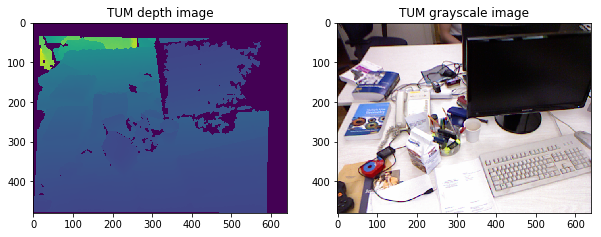

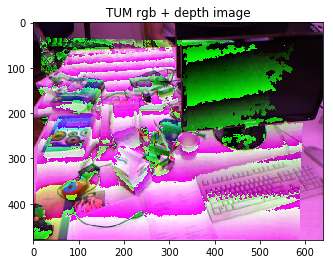

In [74]:
# generate point clouds
import matplotlib.pyplot as plt
idx = 11
depth_file = depth_list[idx]
color_file = rgb_list[idx]

def get_point_cloud_from_images(color_file, depth_file):
    from PIL import Image
    depth = Image.open(depth_file)
    rgb = Image.open(color_file)
    points = []

    ## parameters
#     517.3	516.5	318.6	255.3
    focalLength = 517
    centerX = 318.6
    centerY = 255.3
    scalingFactor = 5000.0

    for v in range(rgb.size[1]):
        for u in range(rgb.size[0]):
            color = rgb.getpixel((u,v))
            Z = depth.getpixel((u,v)) / scalingFactor
            if Z==0: continue
            X = (u - centerX) * Z / focalLength
            Y = (v - centerY) * Z / focalLength
#             points.append("%f %f %f %d %d %d 0\n"%(X,Y,Z,color[0],color[1],color[2]))
            points.append([X,Y,Z])

    print(f"points: {points[:3]}")
    return np.array(points)
    pass

points = get_point_cloud_from_images(color_file, depth_file)
depth = Image.open(depth_file)
rgb = Image.open(color_file)
# plot images
plt.figure(figsize=(10,20))
plt.subplot(1, 2, 1)
plt.title('TUM depth image')
plt.imshow(depth/np.array(depth).max())
plt.subplot(1, 2, 2)
plt.title('TUM grayscale image')
plt.imshow(rgb)
plt.show()
plt.title('TUM rgb + depth image')
overlay = np.array(rgb)
overlay[..., 1] = overlay[..., 1]/2 + np.array(depth)/2
# np.array(rgb)/2 + np.array(depth)[..., np.newaxis]/2
plt.imshow(overlay)
plt.show()


pose: [[1. 0. 0. 0.]
 [0. 1. 0. 0.]
 [0. 0. 1. 0.]], intrinsics: [[517.306408   0.       318.64304 ]
 [  0.       516.469215 255.313989]
 [  0.         0.         1.      ]]
front_mask: (229854,)
T_c_w: [[1. 0. 0. 0.]
 [0. 1. 0. 0.]
 [0. 0. 1. 0.]]
points_2d: (229854, 2), [[14.86310679 34.24118962]
 [15.86369946 34.24118962]
 [16.86429212 34.24118962]
 [17.86488479 34.24118962]
 [18.86547745 34.24118962]
 [19.86607012 34.24118962]
 [20.86666278 34.24118962]
 [21.86725545 34.24118962]
 [27.87081144 34.24118962]
 [28.87140411 34.24118962]], max: 594.2062599943034, 1.8554021413493078
points_2d[:,0][:nums]: [14.86310679 15.86369946 16.86429212 17.86488479 18.86547745 19.86607012
 20.86666278 21.86725545 27.87081144 28.87140411]


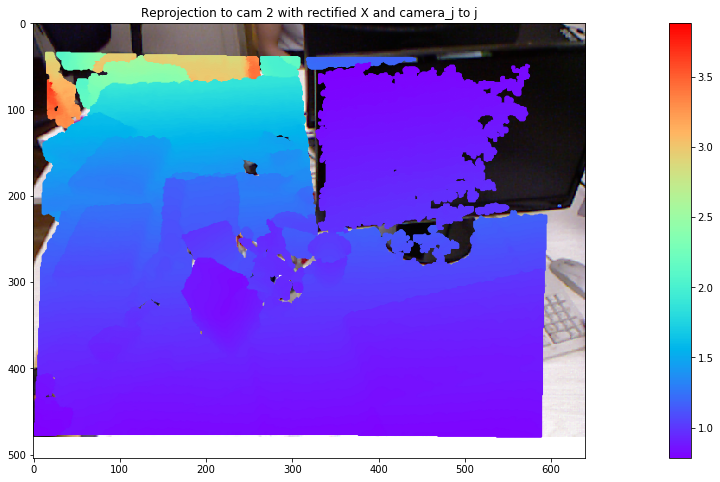

In [75]:
# pose and intrinsics
# pose = poses[0]
pose = np.eye(4)[:3]
points_3d = points
print(f"pose: {pose}, intrinsics: {intrinsics}")

# mask 3d points
front_mask = points_3d[:, -1]>0
print(f"front_mask: {front_mask.shape}")
points_3d = points_3d[front_mask]

# points_2d = K * T_cam_world * points_3d
import numpy as np
from numpy.linalg import inv
from dsac_tools import utils_misc, utils_vis
T_c_w = np.linalg.inv(utils_misc.Rt_pad(pose))[:3]
T_c_w = np.linalg.inv(utils_misc.Rt_pad(pose))[:3]
# T_c_w = utils_misc.Rt_pad(pose)[:3]
points_3d_homo = utils_misc.homo_np(points_3d)
K = intrinsics
points_2d = K @ T_c_w @ points_3d_homo.T
points_2d = utils_misc.de_homo_np(points_2d.T)
print(f"T_c_w: {T_c_w}")
print(f"points_2d: {points_2d.shape}, {points_2d[:10]}, max: {points_2d.max()}, {points_2d.min()}")

# plot out 2d points
nums = 10
print(f"points_2d[:,0][:nums]: {points_2d[:,0][:nums]}")
# plt.scatter(points_2d[:,0][:nums], points[:,1][:nums])
sample_Xj = points_3d
img2_rgb = np.array(rgb)
param_list = [K, img2_rgb.shape]
_, xj = utils_vis.reproj_and_scatter(utils_misc.identity_Rt(), sample_Xj, img2_rgb, visualize=True, title_appendix='j to j', param_list=param_list, debug=False,)



rgb_list[100]: /data/tum/rgbd_dataset_freiburg1_xyz//rgb/1305031105.511332.png, depth_list[100]: /data/tum/rgbd_dataset_freiburg1_xyz//depth/1305031105.497931.png
Read TUM dataset
RGBDImage of size 
Color image : 640x480, with 1 channels.
Depth image : 640x480, with 1 channels.
Use numpy.asarray to access buffer data.


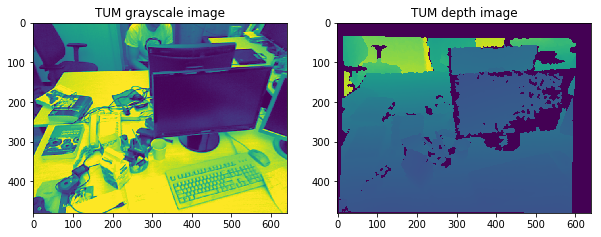

xyz_load: (229875, 3), [-1.30858745  0.88024459 -2.24880004]
rgbd_image_c: (480, 640), rgbd_image_d: (480, 640)
rgbd_image_comb: (3, 480, 640)


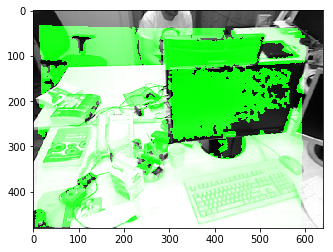

In [42]:
# examples/Python/Basic/rgbd_tum.py
%matplotlib inline
import open3d as o3d
import matplotlib.pyplot as plt
import glob
from pathlib import Path

dataset_path = '/data/tum/rgbd_dataset_freiburg1_xyz/'
index = 100

if __name__ == "__main__":
    rgb_list = sorted(glob.glob(dataset_path + '/rgb/*.png'))
    depth_list = sorted(glob.glob(dataset_path + '/depth/*.png'))
    print(f"rgb_list[{index}]: {rgb_list[index]}, depth_list[{index}]: {depth_list[index]}")
    
    print("Read TUM dataset")
    color_raw = o3d.io.read_image(
        rgb_list[0])
    depth_raw = o3d.io.read_image(
        depth_list[0])
    rgbd_image = o3d.geometry.RGBDImage.create_from_tum_format(
        color_raw, depth_raw)
    print(rgbd_image)
    plt.figure(figsize=(10,20))
    plt.subplot(1, 2, 1)
    plt.title('TUM grayscale image')
    plt.imshow(rgbd_image.color)
    plt.subplot(1, 2, 2)
    plt.title('TUM depth image')
    plt.imshow(rgbd_image.depth)
    plt.show()
    pcd = o3d.geometry.PointCloud.create_from_rgbd_image(
        rgbd_image,
        o3d.camera.PinholeCameraIntrinsic(
            o3d.camera.PinholeCameraIntrinsicParameters.PrimeSenseDefault))
    # Flip it, otherwise the pointcloud will be upside down
    pcd.transform([[1, 0, 0, 0], [0, -1, 0, 0], [0, 0, -1, 0], [0, 0, 0, 1]])
    o3d.visualization.draw_geometries([pcd])
    
    
    # jupyter visualization
#     from open3d import JVisualizer
#     import open3d as o3
#     fragment = o3.read_point_cloud(pcd)
#     visualizer = JVisualizer()
#     visualizer.add_geometry(pcd)
#     visualizer.show()

    # convert Open3D.o3d.geometry.PointCloud to numpy array
    xyz_load = np.asarray(pcd.points)
    print(f'xyz_load: {xyz_load.shape}, {xyz_load[0]}')
#     print(xyz_load)
    
    # process as np
    import numpy as np
    rgbd_image_c = np.asarray(rgbd_image.color)
    rgbd_image_d = np.asarray(rgbd_image.depth)
    print(f"rgbd_image_c: {rgbd_image_c.shape}, rgbd_image_d: {rgbd_image_d.shape}")
    rgbd_image_comb = img_overlap(np.zeros_like(rgbd_image_c), rgbd_image_d, rgbd_image_c)
    print(f"rgbd_image_comb: {rgbd_image_comb.shape}")
    plt.imshow(rgbd_image_comb.transpose([1,2,0]))
    plt.show()
    

In [28]:
# from open3d import open3d as o3
# fragment = o3.read_point_cloud(pcd)


geometry::PointCloud with 229875 points.

In [23]:
import open3d
from open3d import JVisualizer

open3d.__version__

'0.8.0.0'

NameError: name 'read_point_cloud' is not defined

## EuRoc data loader

In [56]:
args = parser.parse_args("--dump --dataset_dir /data/euroc --with_pose --with_X \
                        --with_sift --dump_root /data/euroc_test/ \
                        --num_threads=1  --cam_id 00".split())
print(args)

# %reload_ext autoreload
# %autoreload 2

from euroc_seq_loader import euroc_seq_loader
assert args.cam_id in ['00', '02'], 'Only supported left greyscale/color cameras (cam 00 or 02)!'
data_loader = euroc_seq_loader(args.dataset_dir,
                             img_height=args.img_height,
                             img_width=args.img_width,
                             cam_ids=[args.cam_id],
                             get_X=args.with_X,
                             get_pose=args.with_pose,
                             get_sift=args.with_sift, 
                             get_SP=args.with_SP)

print(f"data_loader: {data_loader}")
n_scenes = {'train': len(data_loader.scenes['train']), 'test': len(data_loader.scenes['test'])}
print('Found %d potential train scenes, and %d test scenes.'%(n_scenes['train'], n_scenes['test']))

print(f"one scene: {data_loader.scenes['train'][0]}")


2019-10-03 15:36:42 ubuntu root[31447] INFO +++ Dumping as npy


Namespace(cam_id='00', dataset_dir='/data/euroc', dump=True, dump_root='/data/euroc_test/', img_height=376, img_width=1241, num_threads=1, static_frames_file=None, test_scene_file=None, with_SP=False, with_X=True, with_pose=True, with_sift=True)
data_loader: <euroc_seq_loader.euroc_seq_loader object at 0x7efc12c42be0>
Found 1 potential train scenes, and 1 test scenes.
one scene: /data/euroc/mav0


In [44]:
# dump scenes
drive_path = data_loader.scenes['train'][0]
split = 'train'
data_loader.dump_drive(args, drive_path, split=split, scene_data=None)

2019-10-02 21:14:47 ubuntu root[31447] INFO Gathering info for /data/euroc/mav0...
  0%|          | 12/3682 [00:00<00:32, 111.67it/s]

cid_num: 0
img_files: /data/euroc/mav0/cam0/data/1403636579763555584.png


100%|██████████| 3682/3682 [00:35<00:00, 102.59it/s]
/home/yyjau/Documents/kitti_instance_RGBD_utils_yyj/kitti_tools/euroc_seq_loader.py:255: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  config = yaml.load(f)


---scale_P


AssertionError: scene_data[N_frames]!=poses.shape[0], 3682!=36382

In [ ]:
# unit test




In [41]:
def load_intrinsics( calib_data ):

  width, height = calib_data['resolution']
  #cam_info.distortion_model = 'plumb_bob'
  D = np.array(calib_data['distortion_coefficients'])
  #cam_info.R = [1, 0, 0, 0, 1, 0, 0, 0, 1]
  fu, fv, cu, cv = calib_data['intrinsics']
  K = np.array([[fu, 0, cu],
                [0, fv, cv],
                [0, 0, 1]])

  return height, width, K, D


# parse camera calibration yaml file
def load_extrinsics( calib_data ):

    # read homogeneous rotation and translation matrix
    transformation_base_camera = np.array(calib_data['T_BS']['data'])
    transformation_base_camera = transformation_base_camera.reshape( (4,4) )
    
    # compute projection matrix
    #  projection = np.zeros((3,4))
    #  projection[:,:-1] = K
    #  cam_info.P = projection.reshape(-1,).tolist()

    return transformation_base_camera

def loadConfig(filename):
    import yaml
    with open(filename, 'r') as f:
        config = yaml.load(f)
    return config

calib_file = '/data/euroc/mav0/cam0/sensor.yaml'
calib_data = loadConfig(calib_file)

intrinsics = load_intrinsics(calib_data)
height, width, K, D = intrinsics
transformation_base_camera = load_extrinsics(calib_data)
print(f"height, width, K, D = {intrinsics}")
print(f"transformation_base_camera: {transformation_base_camera}")
P = np.concatenate((K, [[0],[0],[0]]), axis=1)
print(f"P = {P}")


height, width, K, D = (480, 752, array([[458.654,   0.   , 367.215],
       [  0.   , 457.296, 248.375],
       [  0.   ,   0.   ,   1.   ]]), array([-2.83408110e-01,  7.39590700e-02,  1.93590000e-04,  1.76187114e-05]))
transformation_base_camera: [[ 0.01486554 -0.99988093  0.0041403  -0.02164015]
 [ 0.99955725  0.01496721  0.02571553 -0.06467699]
 [-0.02577444  0.00375619  0.99966073  0.00981073]
 [ 0.          0.          0.          1.        ]]
P = [[458.654   0.    367.215   0.   ]
 [  0.    457.296 248.375   0.   ]
 [  0.      0.      1.      0.   ]]


__main__:32: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.


In [48]:
# filter out time stamps
def filter_pose_time_stamp(input_stamps, pose_stamps):
    output_stamps = pose_stamps
    return output_stamps

input_stamps_file = '/data/euroc/mav0/cam0/data.csv'
pose_stamps_file = '/data/euroc/mav0/state_groundtruth_estimate0/data.csv'

from numpy import genfromtxt
input_stamps = genfromtxt(input_stamps_file, delimiter=',')
pose_stamps = genfromtxt(pose_stamps_file, delimiter=',')

print(f"input_stamps: {input_stamps[0][0]}, pose_stamps: {pose_stamps[0][0]}")

filter_pose_time_stamp(input_stamps, pose_stamps)

# change to kitti format

input_stamps: 1.4036365797635556e+18, pose_stamps: 1.4036365808385556e+18


array([[ 1.40363658e+18,  4.68831900e+00, -1.78693800e+00, ...,
        -2.52660000e-02,  1.36696000e-01,  7.55930000e-02],
       [ 1.40363658e+18,  4.68817700e+00, -1.78677000e+00, ...,
        -2.52660000e-02,  1.36696000e-01,  7.55930000e-02],
       [ 1.40363658e+18,  4.68802800e+00, -1.78659800e+00, ...,
        -2.52660000e-02,  1.36696000e-01,  7.55930000e-02],
       ...,
       [ 1.40363676e+18,  4.57395700e+00, -1.94149200e+00, ...,
        -2.54970000e-02,  1.36267000e-01,  7.64040000e-02],
       [ 1.40363676e+18,  4.57324000e+00, -1.94176400e+00, ...,
        -2.54970000e-02,  1.36267000e-01,  7.64040000e-02],
       [ 1.40363676e+18,  4.57253100e+00, -1.94202300e+00, ...,
        -2.54970000e-02,  1.36267000e-01,  7.64040000e-02]])

In [51]:
x = np.arange(10)
condlist = [x<3, x>5]
choicelist = [x, x**2]
np.select(condlist, choicelist)

array([ 0,  1,  2,  0,  0,  0, 36, 49, 64, 81])

In [29]:
from path import Path
Path("./")

Path('./')

# [2] Dump (Do not run; run the command below instead)

> python dump_img.py --dump --with_pose --with_X --with_sift --static_frames_file /home/ruizhu/Documents/Projects/SfmLearner-Pytorch/data/static_frames.txt --test_scene_file /home/ruizhu/Documents/Projects/SfmLearner-Pytorch/data/test_scenes.txt --dataset_dir /data/kitti/raw --dump_root /home/ruizhu/Documents/Datasets/kitti/kitti_dump/corr_dump_siftIdx_npy_speed05_delta1235 --num_threads=1

In [123]:
parser = argparse.ArgumentParser(description='Foo')
parser.add_argument("--dataset_dir", type=str, default="/data/KITTI/raw_meta/", help="path to dataset")   
parser.add_argument("--num_threads", type=int, default=1, help="number of thread to load data")
parser.add_argument("--img_height", type=int, default=128, help="number of thread to load data")
parser.add_argument("--img_width", type=int, default=416, help="number of thread to load data")
parser.add_argument("--static_frames_file", type=str, default="ref/static_frames.txt", help="static data file path")
parser.add_argument("--test_scene_file", type=str, default="ref/test_scenes_eigen.txt", help="test data file path")
parser.add_argument('--dump', action='store_true', default=False)
parser.add_argument("--with_X", action='store_true', default=False,
                    help="If available (e.g. with KITTI), will store visable rectified lidar points ground truth along with images, for validation")
parser.add_argument("--with_pose", action='store_true', default=True,
                    help="If available (e.g. with KITTI), will store pose ground truth along with images, for validation")
parser.add_argument("--with_sift", action='store_true', default=False,
                    help="If available (e.g. with KITTI), will store SIFT points ground truth along with images, for validation")
parser.add_argument("--dump_root", type=str, default='dump', help="Where to dump the data")

args = parser.parse_args('--dump --with_X --with_pose --with_sift \
    --static_frames_file /home/ruizhu/Documents/Projects/SfmLearner-Pytorch/data/static_frames.txt \
    --test_scene_file /home/ruizhu/Documents/Projects/SfmLearner-Pytorch/data/test_scenes.txt \
    --dataset_dir /home/ruizhu/Documents/Datasets/kitti/raw \
    --dump_root /home/ruizhu/Documents/Datasets/kitti/corr_dump'.split())
print(args)

%reload_ext autoreload
%autoreload 2
from kitti_raw_loader import KittiRawLoader

data_loader = KittiRawLoader(args.dataset_dir,
                             static_frames_file=args.static_frames_file,
                             test_scene_file=args.test_scene_file,
                             img_height=args.img_height,
                             img_width=args.img_width,
                             get_X=args.with_X,
                             get_pose=args.with_pose,
                             get_sift=args.with_sift)

drive_path_test = data_loader.get_drive_path('2011_09_26', '0005')
data_loader.scenes = [drive_path_test]

n_scenes = len(data_loader.scenes)
print('Found {} potential scenes'.format(n_scenes))

args_dump_root = Path(args.dump_root)
args_dump_root.mkdir_p()

print('== Retrieving frames')
def dump_scenes_from_drive(args, drive_path):
    scene_list = data_loader.collect_scenes(drive_path)
    data_loader.dump_drive(args, drive_path, scene_list)
    return scene_list

if args.num_threads == 1:
    for drive_path in tqdm (data_loader.scenes):
        scene_list = dump_scenes_from_drive(args, drive_path)
else:
    with ProcessPool(max_workers=args.num_threads) as pool:
        tasks = pool.map(dump_scenes_from_drive, [args]*n_scenes, data_loader.scenes)
        try:
            for _ in tqdm(tasks.result(), total=n_scenes):
                pass
        except KeyboardInterrupt as e:
            tasks.cancel()
            raise e
    
print('== Generating train val lists')
np.random.seed(8964)
val_ratio = 0.0
# to avoid data snooping, we will make two cameras of the same scene to fall in the same set, train or val
subdirs = args_dump_root.dirs() # e.g. Path('./data/kitti_dump/2011_09_30_drive_0034_sync_02')
canonic_prefixes = set([subdir.basename()[:-2] for subdir in subdirs]) # e.g. '2011_09_28_drive_0039_sync_'
with open(args_dump_root / 'train.txt', 'w') as tf:
    with open(args_dump_root / 'val.txt', 'w') as vf:
        for pr in tqdm(canonic_prefixes):
            corresponding_dirs = args_dump_root.dirs('{}*'.format(pr)) # e.g. [Path('./data/kitti_dump/2011_09_30_drive_0033_sync_03'), Path('./data/kitti_dump/2011_09_30_drive_0033_sync_02')]
            if np.random.random() < val_ratio:
                for s in corresponding_dirs:
                    vf.write('{}\n'.format(s.name))
            else:
                for s in corresponding_dirs:
                    tf.write('{}\n'.format(s.name))

Namespace(dataset_dir='/home/ruizhu/Documents/Datasets/kitti/raw', dump=True, dump_root='/home/ruizhu/Documents/Datasets/kitti/corr_dump', img_height=128, img_width=416, num_threads=1, seed=0, static_frames_file='/home/ruizhu/Documents/Projects/SfmLearner-Pytorch/data/static_frames.txt', test_scene_file='/home/ruizhu/Documents/Projects/SfmLearner-Pytorch/data/test_scenes.txt', with_X=True, with_pose=True, with_sift=True)


# [3] Sequence read

## RAW KITTI

In [1]:
%reload_ext autoreload
%autoreload 2
import numpy as np
import matplotlib.pyplot as plt
import torch
from torch.autograd import Variable
import torch.backends.cudnn as cudnn
import torch.optim
import torch.nn as nn
import torch.nn.functional as F
import torch.utils.data

parser = argparse.ArgumentParser(description='Foo')
parser.add_argument("--dump-root", type=str, default='dump', help="Where to dump the data")
parser.add_argument('--sequence-length', type=int, metavar='N', help='sequence length for training', default=2)
parser.add_argument('--delta_ij', type=int, metavar='N', help='increments (e.g. [0, 2, 4], delta_ij=2)', default=1)
parser.add_argument('-b', '--batch_size', default=1, type=int, metavar='N', 
                    help='mini-batch size')
parser.add_argument('--epoch-size', default=0, type=int, metavar='N',
                    help='manual epoch size (will match dataset size if not set)')
parser.add_argument('--epochs', default=1, type=int, metavar='N',
                    help='number of total epochs to run')
parser.add_argument("--with_X", action='store_true', default=False,
                    help="If available (e.g. with KITTI), will store visable rectified lidar points ground truth along with images, for validation")
parser.add_argument("--with_pose", action='store_true', default=False,
                    help="If available (e.g. with KITTI), will store pose ground truth along with images, for validation")
parser.add_argument("--with_sift", action='store_true', default=False,
                    help="If available (e.g. with KITTI), will store SIFT points ground truth along with images, for validation")
parser.add_argument("--load_h5", action='store_true', default=False,
                    help="Load from npy files (Default) or h5 files")
parser.add_argument('--seed', default=0, type=int, help='seed for random functions, and network initialization')
parser.add_argument('-j', '--workers', default=12, type=int, metavar='N', 
                    help='number of data loading workers')

args = parser.parse_args('--with_X --with_pose --with_sift --dump-root /home/ruizhu/Documents/Datasets/kitti/kitti_dump/corr_dump_siftIdx_npy_speed05 --sequence-length 2 --delta_ij 1'.split())
print(args)

# best_error = -1
# n_iter = 0
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(device)

from sequence_folders import SequenceLoader

train_set = SequenceLoader(
        args.dump_root,
        transform=None,
        seed=args.seed,
        train=True,
        sequence_length=args.sequence_length,
        delta_ij=args.delta_ij,
        get_X=args.with_X,
        get_pose=args.with_pose,
        get_sift=args.with_sift,
        load_h5 = args.load_h5
)
np.set_printoptions(precision=8, suppress=True)
print('{} samples found in {} train scenes'.format(len(train_set), len(train_set.scenes)))
# imgs, intrinsics, scene_name, frame_ids, Xs, sift_kps, sift_deses, scene_poses = train_set.__getitem__(0)
# print(scene_name, frame_ids, len(imgs))


train_loader = torch.utils.data.DataLoader(
        train_set, batch_size=args.batch_size, shuffle=False,
        num_workers=args.workers, pin_memory=True)
if args.epoch_size == 0:
    args.epoch_size = len(train_loader) # len(scenes)//batch_size

def train_one_epoch(args, train_loader, epoch_size, count):
    global n_iter, device

    for i, (imgs, intrinsics, scene_name, frame_ids, Xs, sift_kps, sift_deses, scene_poses, matches_all, matches_good, get_flags) in tqdm(enumerate(train_loader)):
        count = max(matches_good.size()[1], count)
        print(count)
#         print([match_good.shape[0] for match_good in matches_good])
        imgs = [img.to(device) for img in imgs]
#         intrinsics = intrinsics.to(device)
#         frame_ids = [frame_id.to(device) for frame_id in frame_ids]
        if args.with_X:
            Xs = [X.to(device) for X in Xs]
        if args.with_sift:
            sift_kps = [sift_kp.to(device) for sift_kp in sift_kps]
            sift_deses = [sift_des.to(device) for sift_des in sift_deses]
            matches_all = [match_all.to(device) for match_all in matches_all]
            matches_good = [match_good.to(device) for match_good in matches_good]
        if args.with_pose:
            scene_poses = [scene_pose.to(device) for scene_pose in scene_poses]
            
        print(scene_poses[1].size())
        break
        
for epoch in range(args.epochs):
    count = -1
    train_loss, count = train_one_epoch(args, train_loader, args.epoch_size, count)

NameError: name 'argparse' is not defined

In [4]:
imgs, intrinsics, scene_name, frame_ids, Xs, sift_kps, sift_deses, scene_poses, matches_all, matches_good, get_flags = train_set.__getitem__(7)
print(scene_name, frame_ids, len(imgs))
import sys
sys.path.append("/home/ruizhu/Documents/Projects/kitti_instance_RGBD_utils")
sys.path.append("/home/ruizhu/Documents/Projects/kitti_instance_RGBD_utils/dsac_tools")
import utils_vis, utils_misc
if get_flags['sifts']:
    delta_Rtij = utils_misc.Rt_depad(scene_poses[-1]) # scene motion
    val_inds_i = utils_vis.reproj_and_scatter(utils_misc.identity_Rt(), Xs[0], imgs[0].astype(np.uint8), visualize=True, title_appendix='frame %d (left)'%0, param_list = [intrinsics, imgs[0].shape[:2]])
    val_inds_j = utils_vis.reproj_and_scatter(delta_Rtij, Xs[0], imgs[-1].astype(np.uint8), visualize=True, title_appendix='frame %d (left)'%1, param_list = [intrinsics, imgs[0].shape[:2]])

if get_flags['matches']:
    print(matches_all.shape)
    utils_vis.draw_corr(imgs[0].astype(np.uint8), imgs[-1].astype(np.uint8), matches_good[:50, :2], matches_good[:50, 2:], linewidth=1)
    utils_vis.draw_corr(imgs[0].astype(np.uint8), imgs[-1].astype(np.uint8), matches_all[:50, :2], matches_all[:50, 2:], linewidth=1)

ValueError: too many values to unpack (expected 11)

## Odo KITTI

In [ ]:
%reload_ext autoreload
%autoreload 2
import numpy as np
import matplotlib.pyplot as plt
import torch
from torch.autograd import Variable
import torch.backends.cudnn as cudnn
import torch.optim
import torch.nn as nn
import torch.nn.functional as F
import torch.utils.data
sys.path.append("/home/ruizhu/Documents/Projects/kitti_instance_RGBD_utils")
import dsac_tools.utils_vis as utils_vis # If cannot find: export KITTI_UTILS_PATH='/home/ruizhu/Documents/Projects/kitti_instance_RGBD_utils'
import dsac_tools.utils_misc as utils_misc # If cannot find: export KITTI_UTILS_PATH='/home/ruizhu/Documents/Projects/kitti_instance_RGBD_utils'

parser = argparse.ArgumentParser(description='Foo')
parser.add_argument("--dump-root", type=str, default='dump', help="Where to dump the data")
parser.add_argument("--dataset", type=str, default='odo', help="['raw', 'odo']")
parser.add_argument('--sequence-length', type=int, metavar='N', help='sequence length for training', default=2)
parser.add_argument('--delta_ij', type=int, metavar='N', help='increments (e.g. [0, 2, 4], delta_ij=2)', default=1)
parser.add_argument('-b', '--batch_size', default=1, type=int, metavar='N', 
                    help='mini-batch size')
parser.add_argument('--epoch-size', default=0, type=int, metavar='N',
                    help='manual epoch size (will match dataset size if not set)')
parser.add_argument('--epochs', default=1, type=int, metavar='N',
                    help='number of total epochs to run')
parser.add_argument("--with_X", action='store_true', default=False,
                    help="If available (e.g. with KITTI), will store visable rectified lidar points ground truth along with images, for validation")
parser.add_argument("--with_pose", action='store_true', default=False,
                    help="If available (e.g. with KITTI), will store pose ground truth along with images, for validation")
parser.add_argument("--with_sift", action='store_true', default=False,
                    help="If available (e.g. with KITTI), will store SIFT points ground truth along with images, for validation")
parser.add_argument("--load_h5", action='store_true', default=False,
                    help="Load from npy files (Default) or h5 files")
parser.add_argument('--seed', default=0, type=int, help='seed for random functions, and network initialization')
parser.add_argument('-j', '--workers', default=12, type=int, metavar='N', 
                    help='number of data loading workers')

args = parser.parse_args('--dataset odo --with_X --with_sift --with_pose --batch_size 1 --dump-root /home/ruizhu/Documents/Datasets/kitti/kitti_dump/odo_corr_dump_siftIdx_npy_delta1235810_test1-4 \
    --sequence-length 2 --delta_ij 5'.split())
print(args)

# best_error = -1
# n_iter = 0
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")

from sequence_loader_odo import SequenceLoader

train_set = SequenceLoader(
        args.dump_root,
        transform=None,
        seed=args.seed,
        mode='train',
        sequence_length=args.sequence_length,
        delta_ij=args.delta_ij,
        get_X=args.with_X,
        get_pose=args.with_pose,
        get_sift=args.with_sift,
        load_h5 = args.load_h5
)
np.set_printoptions(precision=8, suppress=True)
print('{} samples found.'.format(len(train_set)))

train_loader = torch.utils.data.DataLoader(
        train_set, batch_size=args.batch_size, shuffle=True,
        num_workers=args.workers, pin_memory=True)
if args.epoch_size == 0:
    args.epoch_size = len(train_loader) # len(scenes)//batch_size

def train_one_epoch_odo(args, train_loader, epoch_size, count):
    global n_iter, device

    for i, sample in enumerate(train_loader):
#         print(i)
        imgs = sample['imgs'] # list of [batch_size, H, W, 3]
        Ks = sample['K'] # [batch_size, 3, 3]
        scene_names = sample['scene_name']
        frame_ids = sample['frame_ids'] # list(sequence) of batch(list) of frame_ids
        # if config['data']['read_what']['with_pose']: # always true
        cam_poses = sample['cam_poses'] # list of sequence_length tensors, which with size [batch_size, 4, 4]; the first being identity, the rest are [[R; t], [0, 1]]
        scene_poses = sample['releative_scene_poses'] # list of sequence_length tensors, which with size [batch_size, 4, 4]; the first being identity, the rest are [[R; t], [0, 1]]
        if args.with_X:
            X_cam0s = sample['X_cam0s'] # list of [batch_size, 3, Ni]; only support batch_size=1 because of variable points Ni for each sample
            X_cam2s = sample['X_cam2s'] # list of [batch_size, 3, Ni]; only support batch_size=1 because of variable points Ni for each sample
        # if config['data']['read_what']['with_sift']: # always true
        if args.with_sift:
            sift_kps, sift_deses = sample['sift_kps'], sample['sift_deses']
            assert sample['get_flags']['have_matches'][0].numpy(), 'Did not find the corres files!'
            matches_all, matches_good = sample['matches_all'], sample['matches_good']
        
#         if frame_ids[0][0]=='000000':
#             print(frame_ids)
#             print(scene_poses[0].numpy())
#             print(scene_poses[1].numpy())
#             print(poses[0].numpy())
#             print(poses[1].numpy())
# #         break

        K = Ks.numpy()[0]
        i = int(frame_ids[0][0])
        j = int(frame_ids[1][0])
        print(scene_names, frame_ids)

        print(scene_poses[1][0].numpy())
        im1 = imgs[0][0].numpy().astype(np.uint8)
        im2 = imgs[1][0].numpy().astype(np.uint8)
        print(im1.shape[:2])
        
        X_rect_i = X_cam2s[0][0].numpy()
        X_cam0_i = X_cam0s[0][0].numpy()
        X_show_i = X_rect_i if train_set.cam_id=='02' else X_cam0_i
        
        delta_Rtij_camid = scene_poses[1][0].numpy()
        param_list = [K, im1.shape[:2]]

        visualize = True
        utils_vis.reproj_and_scatter(utils_misc.identity_Rt(), X_show_i, im1, visualize=visualize, title_appendix='[1]-%d_to_i%d'%(i, j), param_list=param_list)
        _, x1 = utils_vis.reproj_and_scatter(utils_misc.Rt_depad(delta_Rtij_camid), X_show_i, im2, visualize=visualize, title_appendix='[1]-%d_to_%d'%(i, j), param_list=param_list, set_lim=True)
#         print(X_show_i, im2.shape)
#         print(x1)
        
        break
        
for epoch in range(args.epochs):
    count = -1
    train_one_epoch_odo(args, train_loader, args.epoch_size, count)

# In/outlier test

0
1291/1311 inliers.
[0.6985357  0.6985357  0.6312493  0.6312493  0.6312493  0.6312493
 0.61620814 0.61620814 0.61620814 0.61620814 0.61620814 0.5337947
 0.5337947  0.5337947  0.5337947  0.5337947  0.4641739  0.4641739
 0.4641739  0.3944218 ]


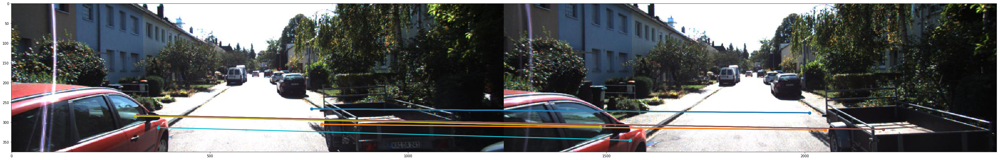

20/1311 outliers.
[   1.2094566    1.2094566    1.2094566    1.2094566    1.2094566
  208.4212     837.6185     837.6185     837.6185    1151.1052
 1151.1052    1151.1052    1151.1052    2252.3635    2252.3635
 2794.0598    3757.3918    3757.3918    3757.3918    3757.3918   ]


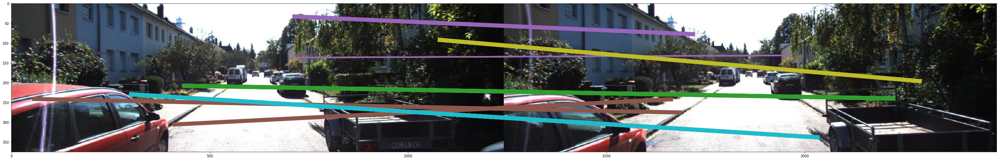

+++++++++++++++++++++++++++++++++++++ inliers with GT w 1291
[Path('2011_09_30_drive_0028_sync_02')] [['0000001690'], ['0000001691']]
GT camera motion
 [[ 0.99999788 -0.00139234 -0.00151868 -0.01591866]
 [ 0.00139202  0.99999901 -0.00021172 -0.01503032]
 [ 0.00151898  0.0002096   0.99999882  0.88091738]]
GT scene motion
 [[ 0.99999788  0.00139202  0.00151898  0.01460145]
 [-0.00139234  0.99999901  0.0002096   0.0148235 ]
 [-0.00151868 -0.00021172  0.99999882 -0.88094371]]
The 3_th (0-based) Rt meets the Cheirality Condition! with [R|t] (camera):
 [[ 0.9999994  -0.00039691 -0.00104854 -0.00430298]
 [ 0.00039634  0.9999998  -0.00065092 -0.01135772]
 [ 0.00104882  0.00065057  0.9999992   0.99992627]]
Recovered by GT ws (camera): The rotation error (degree) 0.0679, and translation error (degree) 0.8534
>>>>>>>>>>>>>>>> Running OpenCV camera pose estimation... [5 point] ---------------
# (104, 63)/1311 inliers from OpenCV.
Recovered by OpenCV 5 point (camera): The rotation error (degree) 0.

ValueError: too many values to unpack (expected 2)

In [16]:
import yaml
import random
import os, sys
sys.path.append('/home/ruizhu/Documents/Projects/kitti_instance_RGBD_utils')
import dsac_tools.utils_F as utils_F # If cannot find: export KITTI_UTILS_PATH='/home/ruizhu/Documents/Projects/kitti_instance_RGBD_utils'
import dsac_tools.utils_opencv as utils_opencv # If cannot find: export KITTI_UTILS_PATH='/home/ruizhu/Documents/Projects/kitti_instance_RGBD_utils'
import dsac_tools.utils_vis as utils_vis # If cannot find: export KITTI_UTILS_PATH='/home/ruizhu/Documents/Projects/kitti_instance_RGBD_utils'
import dsac_tools.utils_misc as utils_misc # If cannot find: export KITTI_UTILS_PATH='/home/ruizhu/Documents/Projects/kitti_instance_RGBD_utils'

with open('/home/ruizhu/Documents/Projects/kitti_instance_RGBD_utils/deepSfm_ori/configs/kitti_corr.yaml', 'r') as f:
    config = yaml.load(f)

gtW_errors = {}
opencv_5point_errors = {}
opencv_8point_errors = {}

from IPython.display import clear_output

for i, sample in enumerate(train_loader):
#     clear_output()
#     if i<7:
#         continue
    print(i)
    imgs = sample['imgs'] # [batch_size, H, W, 3]
    Ks = sample['K'] # [batch_size, 3, 3]
    scene_names = sample['scene_name']
    frame_ids = sample['frame_ids']
    # if config['data']['read_what']['with_pose']: # always true
    scene_poses = sample['scene_poses'] # list of sequence_length tensors, which with size [batch_size, 4, 4]; the first being identity, the rest are [[R; t], [0, 1]]
    Xs = sample['Xs'] # list of [batch_size, 3, Ni]; only support batch_size=1 because of variable points Ni for each sample
    # if config['data']['read_what']['with_sift']: # always true
    sift_kps, sift_deses = sample['sift_kps'], sample['sift_deses']
    assert sample['get_flags']['have_matches'][0].numpy(), 'Did not find the corres files!'
    matches_all, matches_good = sample['matches_all'], sample['matches_good']

    delta_Rtijs_4_4 = scene_poses[1] # [batch_size, 4, 4], asserting we have 2 frames where scene_poses[0] are all identities
    E_gts_list = []
    F_gts_list = []
    for delta_Rtij, K in zip(delta_Rtijs_4_4, Ks):
        E_gt_th, F_gt_th = utils_F._E_F_from_Rt(delta_Rtij[:3, :3], delta_Rtij[:3, 3:4], K.to(torch.float64), tensor_input=True)    
        E_gts_list.append(E_gt_th)
        F_gts_list.append(F_gt_th)
    E_gts = torch.stack(E_gts_list) # [batch_size, 3, 3]
    F_gts = torch.stack(F_gts_list) # [batch_size, 3, 3]
    delta_Rs = delta_Rtijs_4_4[:, :3, :3] # [batch_size, 3, 3]
    delta_ts = delta_Rtijs_4_4[:, :3, 3:4] # [batch_size, 3, 1]
    delta_ts_normalized = F.normalize(delta_ts, p=2, dim=1)
    
    # Get and Normalize points
    matches_use = matches_good
    x1, x2 = matches_use[:, :, :2], matches_use[:, :, 2:] # [batch_size, N, 2(W, H)]
    x1_normalizedK = utils_misc._de_homo(torch.matmul(torch.inverse(Ks), utils_misc._homo(x1).transpose(1, 2)).transpose(1, 2)) # [batch_size, N, 2(W, H)], min/max_X=[-W/2/f, W/2/f]
    x2_normalizedK = utils_misc._de_homo(torch.matmul(torch.inverse(Ks), utils_misc._homo(x2).transpose(1, 2)).transpose(1, 2)) # [batch_size, N, 2(W, H)], min/max_X=[-W/2/f, W/2/f]
        
    # Test epipolar
    F_gts_normalized = Ks.transpose(1, 2)@F_gts.to(torch.float32)@Ks
    K = Ks[0].numpy()
#     utils_opencv.show_epipolar_normalized(x1_normalizedK[0].numpy(), x2_normalizedK[0].numpy(), im1, im2, F_gts_normalized[0].numpy(), [K[1, 2]/K[1, 1], K[0, 2]/K[0, 0]])
# #     utils_opencv.show_epipolar_opencv(x1[0].numpy()[:20], x2[0].numpy()[:20], im1, im2, F_gts.to(torch.float32)[0].numpy())
#     utils_opencv.show_epipolar_rui(x1[0].numpy(), x2[0].numpy(), im1, im2, F_gts.to(torch.float32)[0].numpy(), im1.shape[:2])
    
    # Geometric distance
#     geo_dist = utils_F._sampson_dist
    geo_dist = utils_F._sym_epi_dist
    geo_dists = geo_dist(F_gts_normalized.to(torch.float32), x1_normalizedK, x2_normalizedK)
    dists = geo_dists.numpy().flatten()
    geo_thres = 5e-5
    
    # Visualization
    delta_Rtij = scene_poses[-1].numpy()[0, :3, :] # scene motion 
    im1 = imgs[0].numpy().astype(np.uint8)[0]
    im2 = imgs[1].numpy().astype(np.uint8)[0]
    X1 = Xs[0].numpy()[0]
#     matches_good = matches_good.numpy()[0]
#     matches_all = matches_all.numpy()[0]
    matches_use = matches_use.numpy()[0]
    intrinsics = Ks[0].numpy()
#     val_inds_i = utils_vis.reproj_and_scatter(utils_misc.identity_Rt(), X1, im1, visualize=True, title_appendix='frame %d (left)'%0, param_list = [intrinsics, im1.shape[:2]], set_lim=False)
#     val_inds_j = utils_vis.reproj_and_scatter(delta_Rtij, X1, im2, visualize=True, title_appendix='frame %d (left)'%1, param_list = [intrinsics, im1.shape[:2]], set_lim=False)
#     utils_vis.draw_corr(im1, im2, matches_good[:50, :2], matches_good[:50, 2:], linewidth=2)
    
    inlier_mask = dists<geo_thres
    inlier_sort_idx = np.argsort(dists[inlier_mask])[::-1]
    inlier_num = inlier_sort_idx.shape[0]
    print('%d/%d inliers.'%(inlier_num, matches_use.shape[0]))
    inlier_show_top = 20
#     inlier_show_idx = random.sample(range(sum(inlier_mask)), inlier_show_top)
    inlier_sort_idx = inlier_sort_idx[:inlier_show_top]
#     utils_vis.draw_corr_widths(im1, im2, matches_use[show_idx, :2], matches_use[show_idx, 2:], linewidth=np.ones_like(dists_show[show_idx]), rescale=False, scale=5.)
    print(dists[inlier_mask][inlier_sort_idx]/geo_thres)
    
    utils_vis.draw_corr_widths(im1, im2, matches_use[inlier_mask][inlier_sort_idx, :2], matches_use[inlier_mask][inlier_sort_idx, 2:], \
                               linewidth=dists[inlier_mask][inlier_sort_idx]+geo_thres, rescale=False, scale=2./geo_thres)
    
    outlier_mask = dists>geo_thres
    outlier_sort_idx = np.argsort(dists[outlier_mask])
    outlier_num = outlier_sort_idx.shape[0]
    print('%d/%d outliers.'%(outlier_num, matches_use.shape[0]))
    outlier_show_top = min(outlier_num, 20)
    outlier_sort_idx = outlier_sort_idx[:outlier_show_top]
    print(dists[outlier_mask][outlier_sort_idx]/geo_thres)
    dists[dists>5*geo_thres] = 5*geo_thres
    
    utils_vis.draw_corr_widths(im1, im2, matches_use[outlier_mask][outlier_sort_idx, :2], matches_use[outlier_mask][outlier_sort_idx, 2:], \
                               linewidth=dists[outlier_mask][outlier_sort_idx]+geo_thres, rescale=False, scale=2./geo_thres)
    
    # Quantitative
    idx = 0
    K = Ks[idx]
    x1_single, x2_single = x1[idx], x2[idx]
    w = (geo_dists<geo_thres).float()[idx]
    E_est_th = utils_F._E_from_XY(x1_single, x2_single, K, torch.diag(w))
    print('+++++++++++++++++++++++++++++++++++++ inliers with GT w', torch.sum(w>0.5).item())
    print(scene_names, frame_ids)
    delta_Rtij_inv = np.linalg.inv(delta_Rtijs_4_4[idx].numpy())[:3]
    print('GT camera motion\n', delta_Rtij_inv)
    print('GT scene motion\n', delta_Rtijs_4_4[idx].numpy()[:3])
    M2_list, error_Rt = utils_F._E_to_M(E_est_th.detach(), K.detach(), x1_single.detach().numpy(), x2_single.detach().numpy(), w.detach()>0.5, \
                                        delta_Rtij_inv, depth_thres=500., show_debug=False, show_result=True, method_name='GT ws')
    
    M, error_Rt_5point = utils_opencv.recover_camera_opencv(K.detach().numpy(), x2_single.detach().numpy(), x1_single.detach().numpy(), \
                                                            delta_Rtij_inv, five_point=True, threshold=0.01)
    
    if error_Rt and error_Rt_5point:
        gtW_errors['%d'%i] = error_Rt
        opencv_5point_errors['%d'%i] = error_Rt_5point

    if i > 20:
        break
    if not error_Rt:
        break

gtW_errors:
error_R = 0.9118 ± 11.7140 error_t = 7.5938 ± 29.9346
1643 [179.99464228 179.98581328 179.97637961 179.97456195 179.9632149
 179.92523478 179.91522572   5.129257     3.0858811    2.13638768]


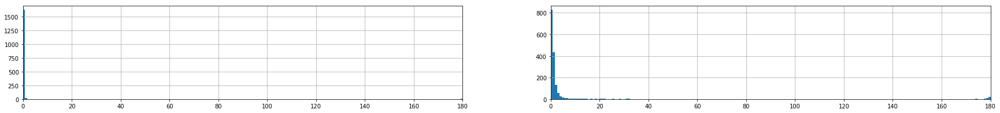

1643
OpenCV 5-point:
error_R = 0.0610 ± 0.2156 error_t = 1.9050 ± 7.7711
1643 [8.22926395 2.51257822 0.61887378 0.58341558 0.53224036 0.33633016
 0.31322209 0.29939356 0.29258254 0.26192854]


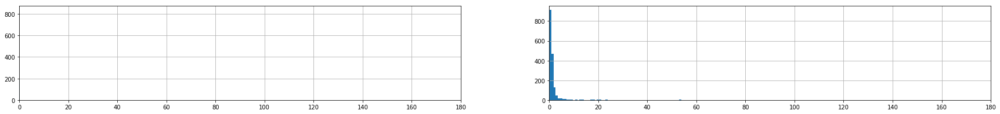

1643


In [97]:
def get_mean_std(errors):
    errors_R = [errors[key][0] for key in errors.keys()]
    errors_t = [errors[key][1] for key in errors.keys()]
    print('error_R = %.4f ± %.4f'%(np.mean(errors_R), np.std(errors_R)), 'error_t = %.4f ± %.4f'%(np.mean(errors_t), np.std(errors_t)))
    
    error_R_lim = 180.
    errors_R = [error_R for error_R in errors_R if error_R<error_R_lim]
    print(len(errors_R), np.sort(errors_R)[::-1][:10])
    plt.figure(figsize=(30, 3))
    plt.subplot(121)
    plt.hist(errors_R, 200)
    plt.xlim(0., error_R_lim)
    plt.grid()
    plt.subplot(122)
    plt.hist(errors_t, 200)
    plt.xlim(0., 180.)
    plt.grid()
    plt.show()
    print(len(errors_R))
    #     errors_t = [error[1] for error in errors]
print('gtW_errors:'); get_mean_std(gtW_errors)
print('OpenCV 5-point:'); get_mean_std(opencv_5point_errors)
# print('OpenCV 8-point:'); get_mean_std(opencv_8point_errors)

# Show epipolar for normalized points

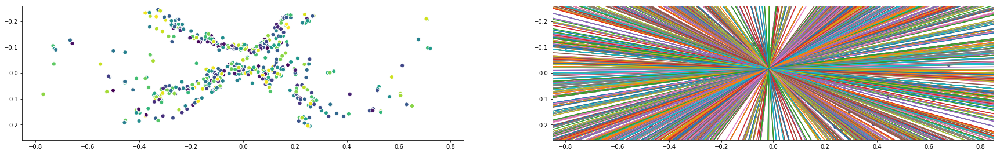

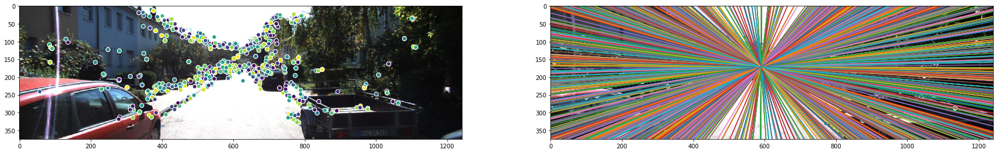

In [141]:
f = 707.0912
H = 183.1104*2
W = 601.8873*2
def show_epipolar_cust(x1, x2, img1_rgb, img2_rgb, F_gt, im_shape):
    N_points = x1.shape[0]
    x1_homo = utils_misc.homo_np(x1)
    x2_homo = utils_misc.homo_np(x2)
    right_P = np.matmul(F_gt, x1_homo.T)
    right_epipolar_x = np.tile(np.array([[-1.], [1.]]), N_points) * im_shape[1]
    # Using the eqn of line: ax+by+c=0; y = (-c-ax)/b, http://ai.stanford.edu/~mitul/cs223b/draw_epipolar.m
    right_epipolar_y = (-right_P[2:3, :] - right_P[0:1, :] * right_epipolar_x) / right_P[1:2, :]

    colors = np.random.rand(x2.shape[0])
    plt.figure(figsize=(30, 8))
    plt.subplot(121)
#     plt.imshow(img1_rgb)
#     plt.scatter(x1[:, 0]*f+W/2., x1[:, 1]*f+H/2., s=50, c=colors, edgecolors='w')
    plt.scatter(x1[:, 0], x1[:, 1], s=50, c=colors, edgecolors='w')
    plt.xlim(-im_shape[1], im_shape[1])
    plt.ylim(im_shape[0], -im_shape[0])
    plt.gca().set_aspect('equal', adjustable='box')
    
    plt.subplot(122)
#     plt.imshow(img2_rgb)
    plt.plot(right_epipolar_x, right_epipolar_y)
    plt.scatter(x2[:, 0], x2[:, 1], s=50, c=colors, edgecolors='w')
#     plt.axis('equal')
    plt.xlim(-im_shape[1], im_shape[1])
    plt.ylim(im_shape[0], -im_shape[0])
    plt.gca().set_aspect('equal', adjustable='box')
    plt.show()

F = F_gts.to(torch.float32)[0].numpy()
K = Ks[0].numpy()
F_test = K.T@F@K
show_epipolar_cust(x1_normalizedK[0].numpy(), x2_normalizedK[0].numpy(), im1, im2, F_test, [K[1, 2]/K[1, 1], K[0, 2]/K[0, 0]])
utils_opencv.show_epipolar_rui(x1[0].numpy(), x2[0].numpy(), im1, im2, F_gts.to(torch.float32)[0].numpy(), im1.shape[:2])

# Test matching

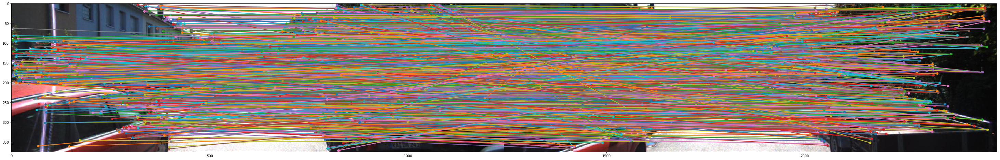

In [88]:
sift_kps1 = sift_kps[0][0].numpy()
sift_kps2 = sift_kps[1][0].numpy()
desc_ii = sift_deses[0][0].numpy()
desc_jj = sift_deses[1][0].numpy()
distmat = np.sqrt(
    np.sum(
        (np.expand_dims(desc_ii, 1) - np.expand_dims(desc_jj, 0))**2,
        axis=2))
# Choose K best from N
obj_num_nn = 1
idx_sort = np.argsort(distmat, axis=1)[:, :obj_num_nn]
idx_sort = (
    np.repeat(
        np.arange(distmat.shape[0])[..., None],
        idx_sort.shape[1], axis=1
    ),
    idx_sort
)
matches_1nn = np.hstack((sift_kps1, sift_kps2[idx_sort[1].flatten(), :]))
utils_vis.draw_corr(im1, im2, matches_1nn[:, :2], matches_1nn[:, 2:], linewidth=2)

In [93]:
print(idx_sort[1].flatten().tolist())
bf = cv2.BFMatcher(normType=cv2.NORM_L2)
FLANN_INDEX_KDTREE = 0
index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
search_params = dict(checks = 50)
flann = cv2.FlannBasedMatcher(index_params, search_params)

matches = flann.knnMatch(desc_ii.astype(np.float32), desc_jj.astype(np.float32), k=2) # another option is https://github.com/MagicLeapResearch/SuperPointPretrainedNetwork/blob/master/demo_superpoint.py#L309
# store all the good matches as per Lowe's ratio test.
good = []
all_m = []
for m,n in matches:
    all_m.append(m)
    if m.distance < 0.7*n.distance:
        good.append(m)

good_ij = [[mat.queryIdx for mat in good], [mat.trainIdx for mat in good]]
all_ij = [[mat.queryIdx for mat in all_m], [mat.trainIdx for mat in all_m]]
print(all_ij[1])


[1962, 1713, 1338, 636, 387, 354, 657, 610, 718, 267, 1885, 335, 305, 1106, 891, 266, 704, 517, 1696, 1812, 1156, 827, 128, 540, 1325, 772, 671, 1110, 427, 1168, 1215, 1214, 1581, 1483, 436, 1323, 173, 920, 501, 1401, 1506, 295, 1, 937, 200, 1540, 577, 59, 1168, 1015, 92, 1747, 1532, 1671, 270, 1816, 1032, 1062, 1211, 1610, 250, 686, 924, 17, 1532, 947, 1538, 710, 1816, 622, 1215, 13, 738, 67, 1078, 1253, 1969, 481, 658, 779, 1720, 318, 1011, 260, 837, 1310, 915, 110, 422, 671, 1366, 826, 1537, 4, 100, 1836, 1302, 886, 792, 274, 94, 1653, 1219, 947, 753, 1788, 175, 942, 92, 1622, 503, 1772, 1665, 1341, 857, 36, 1081, 1422, 579, 80, 466, 1109, 1934, 14, 1868, 426, 894, 1574, 303, 1187, 1329, 1311, 1684, 91, 1374, 786, 1060, 1786, 597, 634, 1847, 114, 998, 710, 1766, 1987, 1616, 1094, 1500, 698, 584, 610, 721, 701, 1110, 1781, 861, 421, 1816, 1031, 980, 925, 1290, 154, 966, 56, 165, 1291, 272, 584, 1451, 67, 1295, 1742, 1986, 1272, 1959, 1917, 1074, 1475, 307, 286, 1239, 836, 1796, 1538,

In [78]:
desc_ii.astype(np.float64)

array([[  9.,  93.,  26., ...,   0.,   1.,  14.],
       [  0.,   0.,   0., ...,  17.,  32.,  49.],
       [  2.,   1.,   9., ...,   0.,   5.,  38.],
       ...,
       [  1.,   1.,   3., ...,   2.,  22.,  53.],
       [ 14.,  69.,  28., ...,   0.,   0.,   4.],
       [ 80., 111.,  21., ...,   2.,   0.,   0.]])